# Airline Passenger Satisfaction Analysis using Machine Learning Techniques


### 1) Load the required libraries

In [1]:
# import 'os'
import  os

# import 'Pandas' 
import pandas as pd 

# import 'Numpy' 
import numpy as np

# import 'matplotlib.pyplot' 
import matplotlib.pyplot as plt

# import 'Seaborn' 
import seaborn as sns

# to suppress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

# display all columns of the dataframe
pd.options.display.max_columns = None

# display all rows of the dataframe
pd.options.display.max_rows = None
 
# to suppress the notation 'e'    
pd.options.display.float_format = '{:.6f}'.format

# import various metrics from 'Scikit-learn' (sklearn)
from sklearn.model_selection import train_test_split

from   sklearn.preprocessing    import  OrdinalEncoder
from   sklearn.preprocessing    import  LabelEncoder
labelencoder = LabelEncoder()

In [2]:
import time
from    datetime   import datetime
from    datetime   import timedelta

start_time = time.time()

In [3]:
# import  os; os.chdir(r'C:\DSE-Capstone\DSE-JAN22')

In [4]:
# Figure size
sns.set(rc={'figure.figsize':(10,10)}) #width=10, #height=10

In [5]:
# 'Statsmodels' is used to build and analyze various statistical models
import statsmodels
import statsmodels.api                        as      sm
import statsmodels.stats.api                  as      sms
import statsmodels.formula.api                as      smf

from    statsmodels.tools.eval_measures       import   rmse
from    statsmodels.compat                    import   lzip
from    statsmodels.stats.outliers_influence  import   variance_inflation_factor
from    statsmodels.stats.diagnostic          import   linear_rainbow

import  statsmodels.tsa.api                   as       smt
from    statsmodels.graphics.gofplots         import   qqplot
from    statsmodels.stats.stattools           import   durbin_watson

# 'SciPy' is used to perform scientific computations
from    scipy                                 import   stats
from    scipy.stats                           import   shapiro

# 'metrics' from sklearn is used for evaluating the model performance
from    sklearn.metrics                       import   mean_absolute_error
from    sklearn.metrics                       import   mean_squared_error
from    statsmodels.stats.outliers_influence  import   variance_inflation_factor

In [6]:
import pandas                         as     pd
import numpy                          as     np
import seaborn                        as     sns
import matplotlib.pyplot              as     plt
import statsmodels.api                as     sm
import sys, os, six

from   sklearn                        import  metrics 
from   sklearn.metrics                import  classification_report
from   sklearn.metrics                import  confusion_matrix
from   sklearn.metrics                import  roc_curve, auc
from   sklearn.model_selection        import  train_test_split, cross_val_score

# !pip install pydotplus ### if not available in the Python Environment
#import pydotplus

# !pip install pydot ### if not available in the Python Environment
#import pydot

## ! pip install  graphviz  ### if not available in the Python Environment

In [7]:
### Imputing missing numerical values using the IterativeImputer class in sklearn 

from sklearn.experimental  import   enable_iterative_imputer
from sklearn.impute        import   IterativeImputer
from sklearn.linear_model   import   LinearRegression


In [8]:
from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
from   sklearn.tree             import _tree

In [9]:
### Calculate VIF and retain those with less VIF    
def calculate_vif_(X, thresh=100):
    cols = X.columns
    variables = np.arange(X.shape[1])
    dropped=True
    while dropped:
        dropped=False
        c = X[cols[variables]].values
        vif = [variance_inflation_factor(c, ix) for ix in np.arange(c.shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X[cols[variables]].columns[maxloc] + '\' at index: ' + str(maxloc))
            variables = np.delete(variables, maxloc)
            dropped=True

    print('Remaining variables:')
    print(X.columns[variables])
    return X[cols[variables]]

In [10]:
"""
    Function name: get_significant_vars
        
    Description: This function lists the significant variables at the specified significance level from the coefficients table

    Input:
      1) Fitted model
    
      2) Desired Level of significance
    
    Output:
      1) List of significant variables at the desired level of significance        

"""
def get_significant_vars( lm, sig_level ):
    
    import pandas as pd
    
    var_p_vals_df         = pd.DataFrame( lm.pvalues )
    var_p_vals_df['vars'] = var_p_vals_df.index
    var_p_vals_df.columns = ['pvals', 'vars']
    
    return list( var_p_vals_df[var_p_vals_df.pvals <= sig_level]['vars'] )

### -----------------------------------------------------------------------------------------------------------------------------    


In [11]:
def check_normality(name, x):
    
  from scipy.stats import skew, kurtosis,tstd


  skew_res_normal        =  "It is normally distributed"
  skew_res_pos           =  "It is not normally distributed and has more weight in the left tail of the distribution"
  skew_res_neg           =  "It is not normally distributed and has more weight in the right tail of the distribution"

  kurtosis_res_normal    =  "It is normally distributed"
  kurtosis_res_pos       =  "It is not normally distributed and leptokurtic and it signifies that it tries to produce more outliers rather than the normal distribution"
  kurtosis_res_neg       =  "It is not normally distributed and playkurtic"
    
  ### Check skewness
  skew_value             =   skew(x, axis = 0, bias = True)
  # bias - Calculations are corrected to statistical bias
    
  if (skew_value == 0):
      print("\nSKEWNESS for %s is %f and %s" % (name, skew_value, skew_res_normal))
  elif(skew_value > 0):
      print("\nSKEWNESS for %s is %f and %s" % (name, skew_value, skew_res_pos))
  elif(skew_value < 0):
      print("\nSKEWNESS for %s is %f and %s" % (name, skew_value, skew_res_neg))

  ###  Check kurtosis         
  kurtosis_value          =   kurtosis(x, axis = 0, bias = True)
  
  if (kurtosis_value == 3):
      print("\nKurtosis for %s is %f and %s" % (name, kurtosis_value, kurtosis_res_normal))
  elif(kurtosis_value > 3):
      print("\nKurtosis for %s is %f and %s" % (name, kurtosis_value, kurtosis_res_pos))
  elif(kurtosis_value < 3):
      print("\nKurtosis for %s is %f and %s" % (name, kurtosis_value, kurtosis_res_neg))

  ###  Check standard deviation         
  std_value          =   tstd(x, axis = 0)    
  print("\STANDARD DEVIATION for %s is %f" % (name, std_value))
    

In [12]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        mz_table['Total Zero & Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero & Missing Values'] = 100 * mz_table['Total Zero & Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
#         mz_table.to_excel('D:/sampledata/missing_and_zero_values.xlsx', freeze_panes=(1,0), index = False)
        return mz_table

In [13]:
"""
    Function name: check_linearity()
        
    Description: This function checks whether continuous Independent Variable is linearly related to the log odds of the IV by plotting the IV in question and look for an S-shaped curve. 

    Input:
          1) Data Frame containing the independent variable
    
          2) Data frame containing the complete data
    
          3) Title for the graph
    
    Output:
          1) a  plot showing the linearity of the independent variable  

"""
def check_linearity(x1, df, title, y1):
    
    import matplotlib.pyplot as plt
    import seaborn           as sns
    
    sns.regplot(x = x1, y= y1, data= df, logistic= True).set_title(title)
    plt.show()

### -----------------------------------------------------------------------------------------------------------------------------  

In [14]:
def logit_to_probability(odds):
  probability  =  np.round(odds / (1 + odds), 4)
  return probability 

# Attributes

ATTRIBUTES

| Variable | Description |
| ------------ | ------------------------|
| Id | Id number of the passengers |
| Gender | Gender of the passengers (Female, Male) | 
| Customer Type| The customer type (Loyal customer, disloyal customer)| 
| Age| The actual age of the passengers| 
| Type of Travel | Purpose of the flight of the passengers (Personal Travel, Business Travel) | 
| Class | Travel class in the plane of the passengers (Business, Eco, Eco Plus)| 
| Flight Distance | The flight distance of this journey| 
| Inflight wifi service | Satisfaction level of the inflight wifi service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Departure/Arrival time convenient | Satisfaction level of Departure/Arrival time convenient (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Ease of Online booking | Satisfaction level of online booking (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Gate location | Satisfaction level of Gate location (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Food and drink | Satisfaction level of Food and drink service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Online boarding | Satisfaction level of online boarding (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
Seat comfort | Satisfaction level of Seat comfort (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Inflight entertainment | Satisfaction level of inflight entertainment (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| On-board service | Satisfaction level of On-board service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Leg room service | Satisfaction level of Leg room service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Baggage handling | Satisfaction level of baggage handling (1,2,3,4,5/ 1=Least Satisfied to 5=Most Satisfied) |
| Checkin service | Satisfaction level of Check-in service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Inflight service | Satisfaction level of inflight service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Cleanliness |Satisfaction level of Cleanliness (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| Departure Delay in Minutes | Minutes delayed when departure |
| Arrival Delay in Minutes | Minutes delayed when arrival |
| Satisfaction | /output column/ Airline satisfaction level ('satisfied', 'neutral or dissatisfied') |

### 2) Read Data File

In [15]:
airline_passenger_satisfaction = pd.read_csv('airline_clnd.csv')
airline_passenger_satisfaction.head().T

,0,1,2,3,4
SR,0,1,2,3,4
id,70172,5047,110028,24026,119299
Gender,Male,Male,Female,Female,Male
Customer_Type,Loyal Customer,disloyal Customer,Loyal Customer,Loyal Customer,Loyal Customer
Age,13,25,26,25,61
Type_of_Travel,Personal Travel,Business travel,Business travel,Business travel,Business travel
Class,Eco Plus,Business,Business,Business,Business
Flight_Distance,460,235,1142,562,214
Inflight_wifi_service,3,3,2,2,3
Departure/Arrival_time_convenient,4,2,2,5,3


In [16]:
airline_passenger_satisfaction.drop(['SR', 'id'],axis=1,inplace=True)
airline_passenger_satisfaction.head()

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000000,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000000,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.000000,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.000000,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.000000,satisfied


In [17]:
airline_passenger_satisfaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             103904 non-null  object 
 1   Customer_Type                      103904 non-null  object 
 2   Age                                103904 non-null  int64  
 3   Type_of_Travel                     103904 non-null  object 
 4   Class                              103904 non-null  object 
 5   Flight_Distance                    103904 non-null  int64  
 6   Inflight_wifi_service              103904 non-null  int64  
 7   Departure/Arrival_time_convenient  103904 non-null  int64  
 8   Ease_of_Online_booking             103904 non-null  int64  
 9   Gate_location                      103904 non-null  int64  
 10  Food_and_drink                     103904 non-null  int64  
 11  Online_boarding                    1039

In [18]:
airline_passenger_satisfaction.describe()

,Age,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
count,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103904.000000,103594.000000
mean,39.379706,1189.448375,2.729683,3.060296,2.756901,2.976883,3.202129,3.250375,3.439396,3.358158,3.382363,3.351055,3.631833,3.304290,3.640428,3.286351,14.815618,15.178678
std,15.114964,997.147281,1.327829,1.525075,1.398929,1.277621,1.329533,1.349509,1.319088,1.332991,1.288354,1.315605,1.180903,1.265396,1.175663,1.312273,38.230901,38.698682
min,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,843.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,51.000000,1743.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [19]:
airline_passenger_satisfaction.select_dtypes (include= ['object']).columns.tolist()

['Gender', 'Customer_Type', 'Type_of_Travel', 'Class', 'satisfaction']

In [20]:
airline_passenger_satisfaction.select_dtypes (exclude= ['object']).columns.tolist ()

['Age',
 'Flight_Distance',
 'Inflight_wifi_service',
 'Departure/Arrival_time_convenient',
 'Ease_of_Online_booking',
 'Gate_location',
 'Food_and_drink',
 'Online_boarding',
 'Seat_comfort',
 'Inflight_entertainment',
 'On-board_service',
 'Leg_room_service',
 'Baggage_handling',
 'Checkin_service',
 'Inflight_service',
 'Cleanliness',
 'Departure_Delay_in_Minutes',
 'Arrival_Delay_in_Minutes']

In [21]:
Most_important_vars = ['Online_boarding', 'Inflight_wifi_service', 'Type_of_Travel', 'Inflight_entertainment',\
                       'Class_code', 'Customer_Type']

In [22]:
df_ = airline_passenger_satisfaction.select_dtypes(exclude=['int', 'float'])
for col in df_.columns:
    print(df_[col].unique()) # to print categories name only
    print(df_[col].value_counts()) 

['Male' 'Female']
Female    52727
Male      51177
Name: Gender, dtype: int64
['Loyal Customer' 'disloyal Customer']
Loyal Customer       84923
disloyal Customer    18981
Name: Customer_Type, dtype: int64
['Personal Travel' 'Business travel']
Business travel    71655
Personal Travel    32249
Name: Type_of_Travel, dtype: int64
['Eco Plus' 'Business' 'Eco']
Business    49665
Eco         46745
Eco Plus     7494
Name: Class, dtype: int64
['neutral or dissatisfied' 'satisfied']
neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64


No garbage values found in categorical variables. 
Hence no garbage values exists in dataset.

## 2.1 Find and report the missing values

In [23]:
missing_zero_values_table(airline_passenger_satisfaction)

Your selected dataframe has 23 columns and 103904 Rows.
There are 1 columns that have missing values.


,Zero Values,Missing Values,% of Total Values,Total Zero & Missing Values,% Total Zero & Missing Values,Data Type
Arrival_Delay_in_Minutes,58159,310,0.300000,58469,56.300000,float64


In [24]:
df   =    airline_passenger_satisfaction.copy()

In [25]:
df['satisfaction'].replace('neutral or dissatisfied', 1, inplace = True)
df['satisfaction'].replace('satisfied', 0, inplace = True)

In [26]:
ord_enc  = OrdinalEncoder()

In [27]:
df['Gender_code']          = ord_enc.fit_transform(df[['Gender']])
df['Customer_Type_code']   = ord_enc.fit_transform(df[['Customer_Type']])
df['Type_of_Travel_code']  = ord_enc.fit_transform(df[['Type_of_Travel']])
df['Class_code']           = ord_enc.fit_transform(df[['Class']])
df.head(2)


,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction,Gender_code,Customer_Type_code,Type_of_Travel_code,Class_code
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000000,1,1.000000,0.000000,1.000000,2.000000
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000000,1,1.000000,1.000000,0.000000,0.000000


In [28]:
num_variables_df = df.select_dtypes(include = 'number')
print(num_variables_df.shape)
print(num_variables_df.columns)

(103904, 23)
Index(['Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction', 'Gender_code', 'Customer_Type_code',
       'Type_of_Travel_code', 'Class_code'],
      dtype='object')


In [29]:
lreg         =  LinearRegression()
imp          =  IterativeImputer(estimator= lreg, missing_values = np.nan, max_iter = 10, verbose = 2,\
                                 imputation_order= 'roman',random_state = 0)
X            =  imp.fit_transform(num_variables_df)

[IterativeImputer] Completing matrix with shape (103904, 23)
[IterativeImputer] Ending imputation round 1/10, elapsed time 2.52
[IterativeImputer] Change: 431.94017285145554, scaled tolerance: 4.9830000000000005 
[IterativeImputer] Ending imputation round 2/10, elapsed time 4.46
[IterativeImputer] Change: 0.0, scaled tolerance: 4.9830000000000005 
[IterativeImputer] Early stopping criterion reached.


In [30]:
X_df           =    pd.DataFrame(X, columns = [ 'Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction', 'Gender_code', 'Customer_Type_code',
       'Type_of_Travel_code', 'Class_code'])

In [31]:
missing_zero_values_table(X_df)  

Your selected dataframe has 23 columns and 103904 Rows.
There are 0 columns that have missing values.


,Zero Values,Missing Values,% of Total Values,Total Zero & Missing Values,% Total Zero & Missing Values,Data Type


In [32]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Age                                103904 non-null  float64
 1   Flight_Distance                    103904 non-null  float64
 2   Inflight_wifi_service              103904 non-null  float64
 3   Departure/Arrival_time_convenient  103904 non-null  float64
 4   Ease_of_Online_booking             103904 non-null  float64
 5   Gate_location                      103904 non-null  float64
 6   Food_and_drink                     103904 non-null  float64
 7   Online_boarding                    103904 non-null  float64
 8   Seat_comfort                       103904 non-null  float64
 9   Inflight_entertainment             103904 non-null  float64
 10  On-board_service                   103904 non-null  float64
 11  Leg_room_service                   1039

In [33]:
X_df.head().T

,0,1,2,3,4
Age,13.000000,25.000000,26.000000,25.000000,61.000000
Flight_Distance,460.000000,235.000000,1142.000000,562.000000,214.000000
Inflight_wifi_service,3.000000,3.000000,2.000000,2.000000,3.000000
Departure/Arrival_time_convenient,4.000000,2.000000,2.000000,5.000000,3.000000
Ease_of_Online_booking,3.000000,3.000000,2.000000,5.000000,3.000000
Gate_location,1.000000,3.000000,2.000000,5.000000,3.000000
Food_and_drink,5.000000,1.000000,5.000000,2.000000,4.000000
Online_boarding,3.000000,3.000000,5.000000,2.000000,5.000000
Seat_comfort,5.000000,1.000000,5.000000,2.000000,5.000000
Inflight_entertainment,5.000000,1.000000,5.000000,2.000000,3.000000


In [34]:
int_type_cols = [ 'Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'satisfaction', 'Gender_code', 'Customer_Type_code',
       'Type_of_Travel_code', 'Class_code']
X_df[int_type_cols] = X_df[int_type_cols].astype(int)
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Age                                103904 non-null  int32  
 1   Flight_Distance                    103904 non-null  int32  
 2   Inflight_wifi_service              103904 non-null  int32  
 3   Departure/Arrival_time_convenient  103904 non-null  int32  
 4   Ease_of_Online_booking             103904 non-null  int32  
 5   Gate_location                      103904 non-null  int32  
 6   Food_and_drink                     103904 non-null  int32  
 7   Online_boarding                    103904 non-null  int32  
 8   Seat_comfort                       103904 non-null  int32  
 9   Inflight_entertainment             103904 non-null  int32  
 10  On-board_service                   103904 non-null  int32  
 11  Leg_room_service                   1039

<AxesSubplot:xlabel='index', ylabel='satisfaction'>

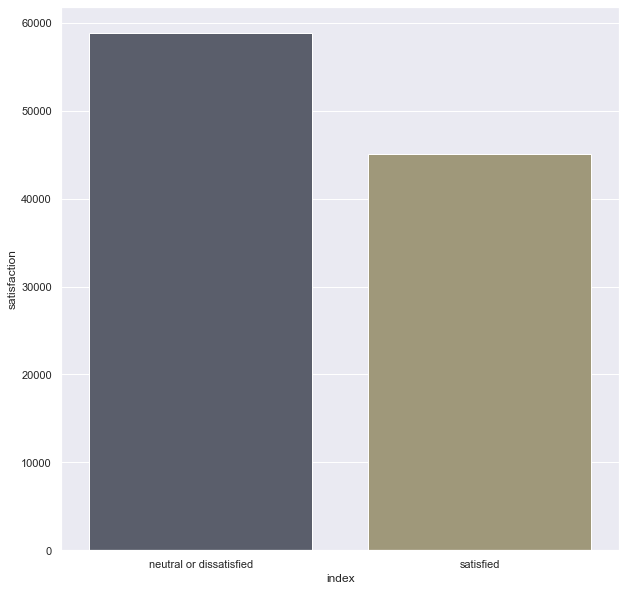

In [35]:
vc  =  airline_passenger_satisfaction['satisfaction'].value_counts().reset_index()
sns.barplot(x = 'index', y = 'satisfaction', data = vc,  palette = 'cividis')

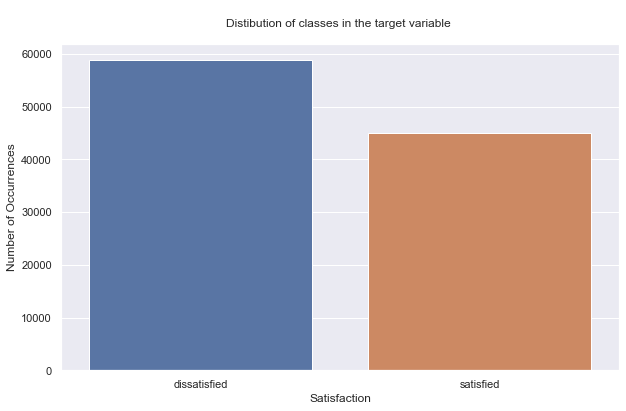

In [36]:
plt.figure(figsize = (10, 6))
latedelrisk =  airline_passenger_satisfaction['satisfaction'].apply(lambda s: s.split('/')[0].split()[-1]).value_counts()
ax          =  sns.barplot(x = latedelrisk.index, y =  latedelrisk.values, data = airline_passenger_satisfaction)
plt.title('\nDistibution of classes in the target variable \n')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Satisfaction', fontsize=12)
# now simply assign the bar values to
# each bar by passing containers method
# to bar_label function
#ax.bar_label(container = ax.containers[0], padding = 3)
plt.show()

## Observation

#### Dataset is not perfectly balanced. We need to use Precision, Recall of the minority class apart from AUROC as performance measures

### 2.3Prepare data for EDA

#### Replace imputed values for the column, satisfaction before doing EDA

In [37]:
X_df['satisfaction'].replace(1, 'neutral or dissatisfied', inplace = True)
X_df['satisfaction'].replace(0, 'satisfied', inplace = True)

In [38]:
airline_passenger_satisfaction['satisfaction']  =   X_df['satisfaction']
X_df.head(2)

,Age,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction,Gender_code,Customer_Type_code,Type_of_Travel_code,Class_code
0,13,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25.000000,18.000000,neutral or dissatisfied,1,0,1,2
1,25,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1.000000,6.000000,neutral or dissatisfied,1,1,0,0


# 3)Outlier Detection:

In [39]:
print(airline_passenger_satisfaction['satisfaction'].value_counts())
print("\nPercentage of class distribution in the target variable\n\n")
print(round(airline_passenger_satisfaction['satisfaction'].value_counts() * 100 /airline_passenger_satisfaction.shape[0], 2))

neutral or dissatisfied    58879
satisfied                  45025
Name: satisfaction, dtype: int64

Percentage of class distribution in the target variable


neutral or dissatisfied   56.670000
satisfied                 43.330000
Name: satisfaction, dtype: float64


# Draw Boxplots

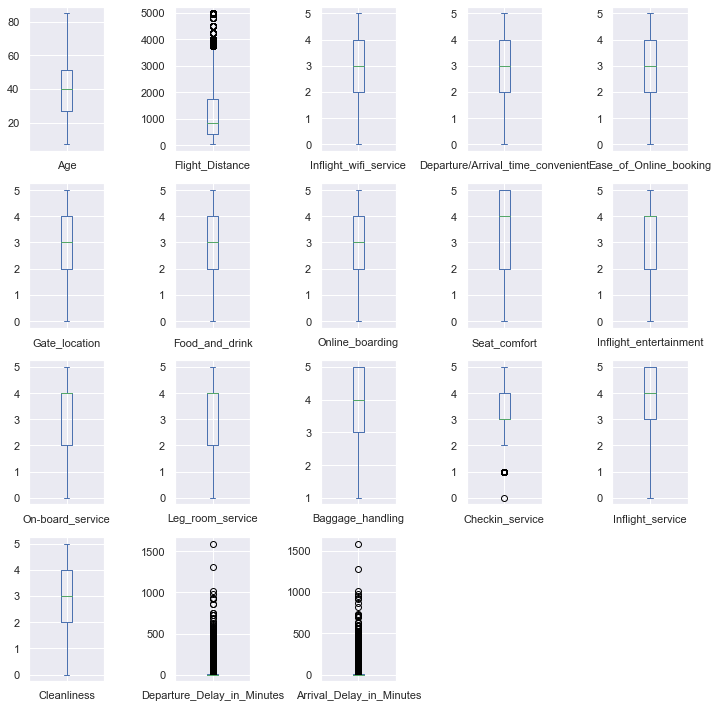

In [40]:
plt.rcParams["figure.figsize"]=[10,10]
airline_passenger_satisfaction.plot(kind='box',subplots=True,layout=(4,5))
plt.tight_layout()
plt.show()

We shall to now detect outliers from the four continuous numerical variables as follows:

* 1)	Age	
* 2)	Flight_Distance
* 3)	Departure_Delay_in_Minutes	
* 4)	Arrival_Delay_in_Minutes


## 1. Age

<AxesSubplot:xlabel='Age'>

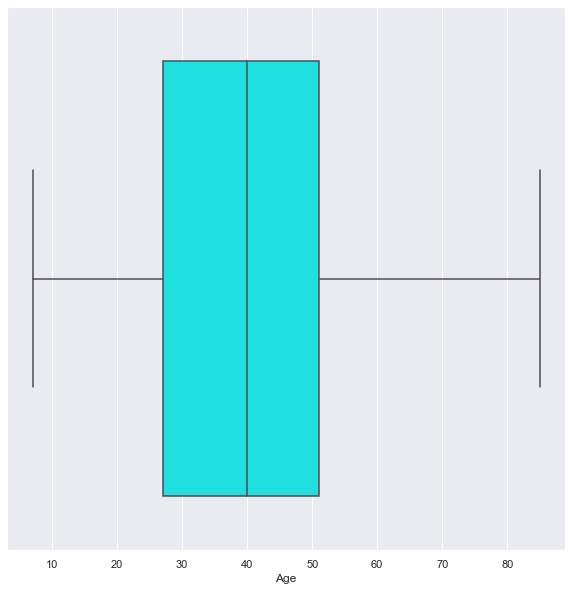

In [41]:
sns.boxplot(data = airline_passenger_satisfaction, x = 'Age', color = 'cyan')

### Observations

There are no outliers for the variable, Age

## 2. Flight_Distance

<AxesSubplot:xlabel='Flight_Distance'>

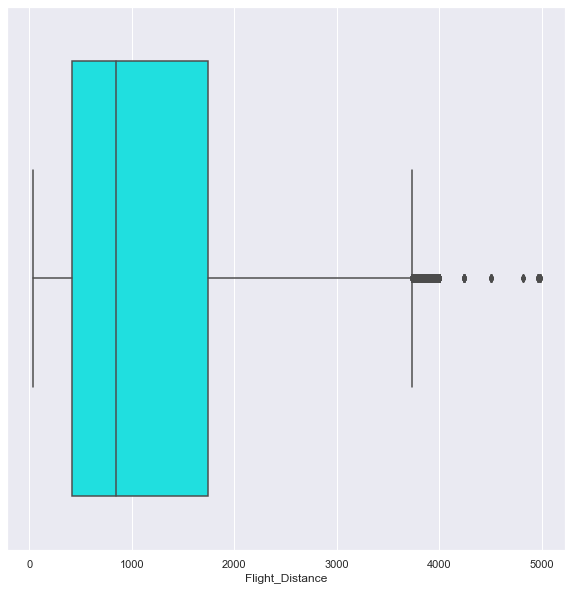

In [42]:
sns.boxplot(data = airline_passenger_satisfaction, x = 'Flight_Distance', color = 'cyan')

In [43]:
# IQR
Q1 = np.percentile(airline_passenger_satisfaction['Flight_Distance'], 25, interpolation = 'midpoint')

Q3 = np.percentile(airline_passenger_satisfaction['Flight_Distance'], 75, interpolation = 'midpoint')

IQR = Q3 - Q1

upper = Q3 + 1.5 * IQR 

In [44]:
ult = airline_passenger_satisfaction.loc[airline_passenger_satisfaction['Flight_Distance'] > upper, 'Flight_Distance']
type(ult)

pandas.core.series.Series

In [45]:
ult.describe()

count   2291.000000
mean    3886.820602
std      152.824681
min     3737.000000
25%     3802.000000
50%     3871.000000
75%     3937.000000
max     4983.000000
Name: Flight_Distance, dtype: float64

Observations
The current record for the longest-distance commercial flight is held by a Boeing 777-200LR. This flight from Hong Kong International Airport to London Heathrow took the long way (vs. great circle distance) and was logged at 21,602 km (13,423 miles / 11,664 nautical miles) The maximum distance possible is 13423 miles and the maximum value as outliers we got is 4983. So we don't treat for outliers for this variable.

## 3. Departure_Delay_in_Minutes

<AxesSubplot:xlabel='Departure_Delay_in_Minutes'>

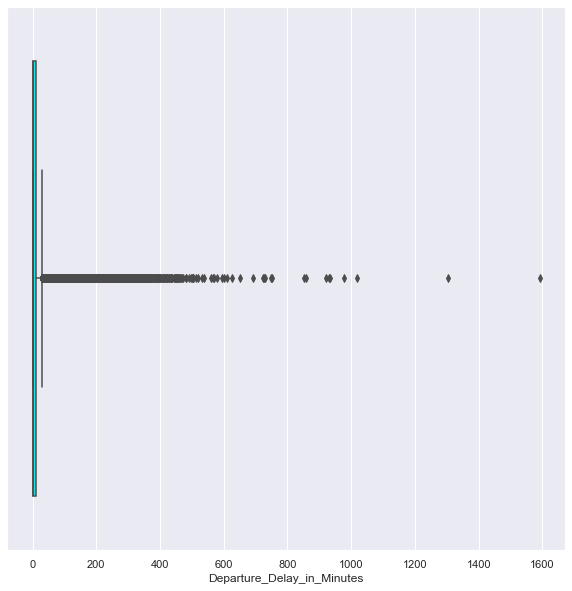

In [46]:
sns.boxplot(data = airline_passenger_satisfaction, x = 'Departure_Delay_in_Minutes', color = 'cyan')

### Observations

The maximum value shown as the outlier for the varaible, is 1592 minutes that is approximately, 27 hours and that is a valid value and hence no outlier treatment is required.

## 4. Arrival_Delay_in_Minutes Boxplot

<AxesSubplot:xlabel='Arrival_Delay_in_Minutes'>

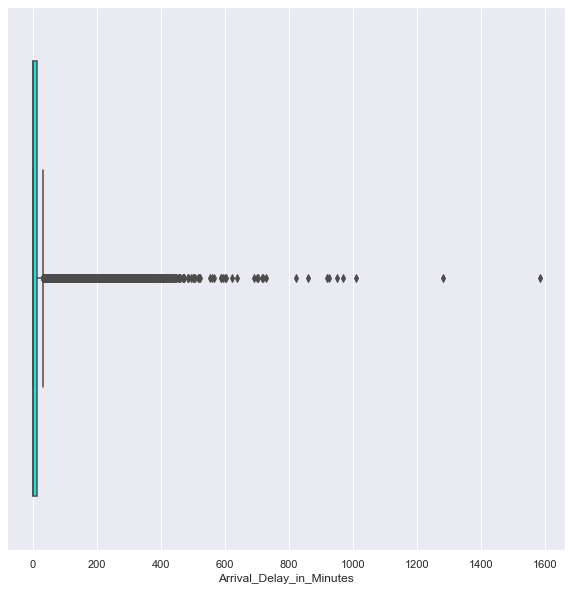

In [47]:
sns.boxplot(data = X_df, x = 'Arrival_Delay_in_Minutes', color = 'cyan')

### Observations

There are outliers that exceed the upper limit of the threshold limit for the variable Arrival_Delay_in_Minutes Let us find out the values of these outliers

In [48]:
# IQR
Q1 = np.percentile(X_df['Arrival_Delay_in_Minutes'], 25, interpolation = 'midpoint')

Q3 = np.percentile(X_df['Arrival_Delay_in_Minutes'], 75, interpolation = 'midpoint')

IQR = Q3 - Q1

upper = Q3 + 1.5 * IQR 

In [49]:
ult2 = X_df.loc[X_df['Arrival_Delay_in_Minutes'] > upper, 'Arrival_Delay_in_Minutes']
type(ult2)

pandas.core.series.Series

In [50]:
ult2.describe()

count   14052.000000
mean       86.415099
std        70.071523
min        32.512217
25%        44.000000
50%        63.000000
75%       103.000000
max      1584.000000
Name: Arrival_Delay_in_Minutes, dtype: float64

### Observations

The maximum value shown as the outlier for the varaible, Arrival_Delay_in_Minutes is 1584 minutes that is approximately, 26 hours and that is a valid value and hence no outlier treatment is required.

### Check for normality

We shall check for normality for the four continuous numerical variables:
    
* 1) Age
* 2) Flight_Distance
* 3) Departure_Delay_in_Minutes
* 4) Arrival_Delay_in_Minutes

**WE SHALL NOT TEST FOR NORMALITY** fo the following 14 variables as they are ordinal and for each of the variables, its distribution is a series of spikes and can't be normal.

It is not really a case of not being continuous as there are discrete variables (e.g. with large counts) that can be very close to normal.

| | | 
| ------ | ------ |
| Inflight_wifi_service | Departure/Arrival_time_convenient |
| Ease_of_Online_booking | Gate_location |
| Food_and_drink | Online_boarding |
| Seat_comfort | Inflight_entertainment
| On-board_service | Leg_room_service | 
| Baggage_handling | Checkin_service | 
| Inflight_service| Cleanliness | 


| 


SKEWNESS for Age is -0.004516 and It is not normally distributed and has more weight in the right tail of the distribution

Kurtosis for Age is -0.719591 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Age is 15.114964


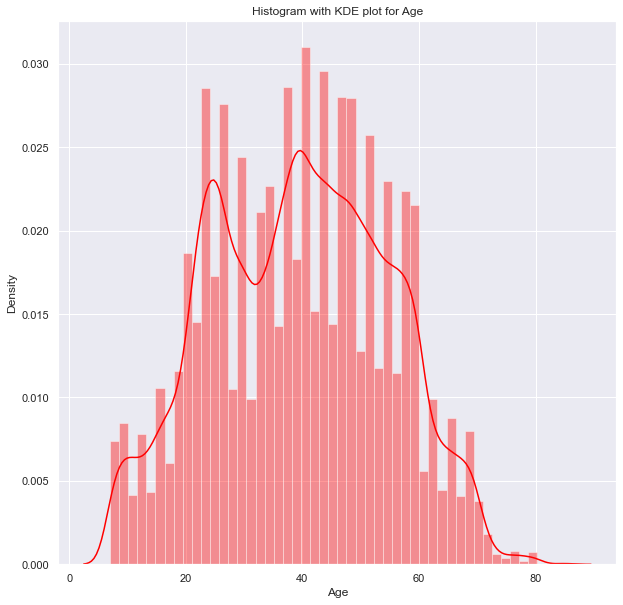


Shapiro Test for  Age, Statistics = 0.988, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Flight_Distance is 1.109450 and It is not normally distributed and has more weight in the left tail of the distribution

Kurtosis for Flight_Distance is 0.268465 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Flight_Distance is 997.147281


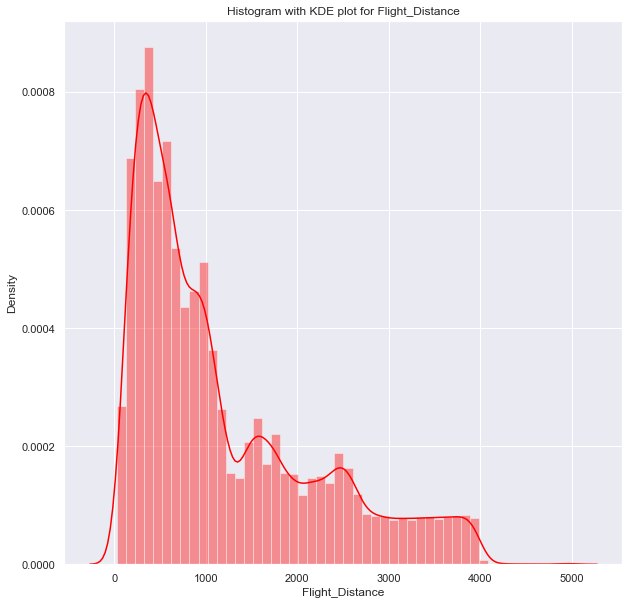


Shapiro Test for  Flight_Distance, Statistics = 0.864, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Departure_Delay_in_Minutes is 6.733882 and It is not normally distributed and has more weight in the left tail of the distribution

Kurtosis for Departure_Delay_in_Minutes is 100.262123 and It is not normally distributed and leptokurtic and it signifies that it tries to produce more outliers rather than the normal distribution
\STANDARD DEVIATION for Departure_Delay_in_Minutes is 38.230901


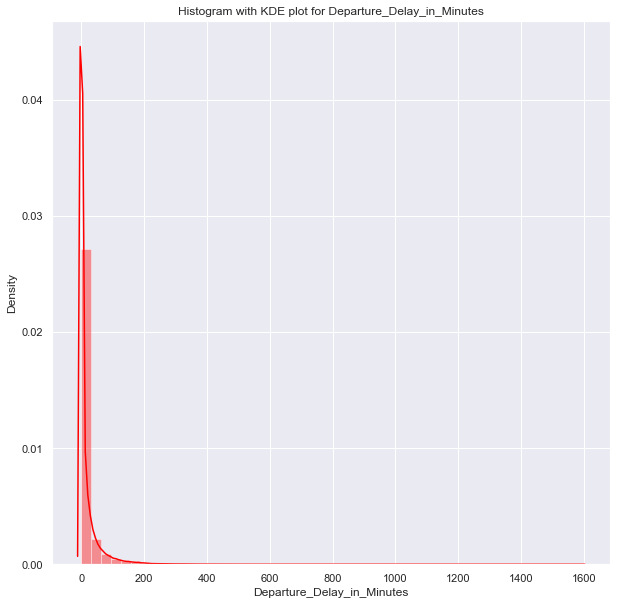


Shapiro Test for  Departure_Delay_in_Minutes, Statistics = 0.423, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Arrival_Delay_in_Minutes is 6.564658 and It is not normally distributed and has more weight in the left tail of the distribution

Kurtosis for Arrival_Delay_in_Minutes is 93.505029 and It is not normally distributed and leptokurtic and it signifies that it tries to produce more outliers rather than the normal distribution
\STANDARD DEVIATION for Arrival_Delay_in_Minutes is 38.802619


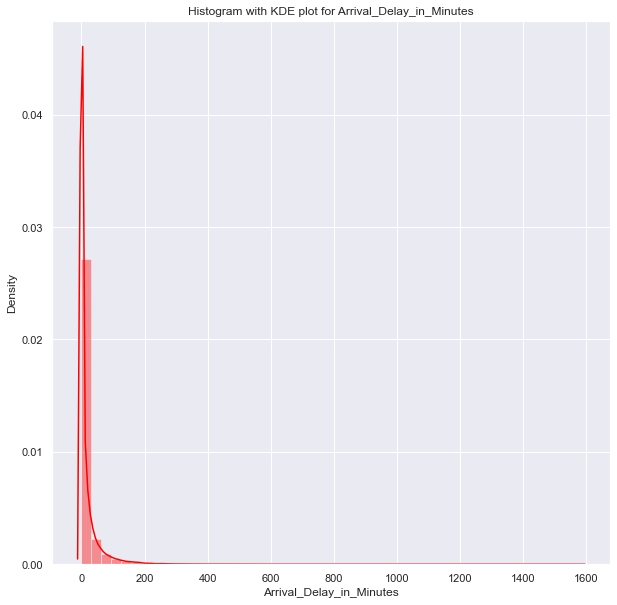


Shapiro Test for  Arrival_Delay_in_Minutes, Statistics = 0.429, p = 0.000
Sample does not look Gaussian (reject H0)


In [51]:
cnum_var          =    ['Age', 'Flight_Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']

for i in range(4):
    name          =    cnum_var[i]
    x             =    X_df[name].tolist()
    check_normality(name, x)
    # plotting histogram and density plot for each variable using distplot() by setting color
    sns.distplot(X_df[name], color='red', hist_kws={"edgecolor": 'white'})
    graph_title  =  'Histogram with KDE plot for ' + name
    plt.title(graph_title)
    # visualizing plot using matplotlib.pyplot library
    plt.show()

    # normality test
    stat, p        =    shapiro(x)
    print('\nShapiro Test for  %s, Statistics = %.3f, p = %.3f' % (name, stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
      print('Sample looks Gaussian (fail to reject H0)')
    else:
      print('Sample does not look Gaussian (reject H0)')

###  Observations

All the four continuous numerical variables are not normally distributed based on the Shapiro test and its skewness and kurtosis value.  We have two options here:
1) Investigate why your data is not normal and perhaps use data preparation techniques to make the data more normal.

2) Look into the use of nonparametric statistical methods like Decision Trees instead of the parametric methods. A non-parametric analysis is to test medians.

# Normalization

In [52]:
from scipy.stats import boxcox
var=['Age', 'Flight_Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']
X_df[var] = np.log(X_df[var]+1)


SKEWNESS for Age is -0.986812 and It is not normally distributed and has more weight in the right tail of the distribution

Kurtosis for Age is 0.828380 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Age is 0.446285


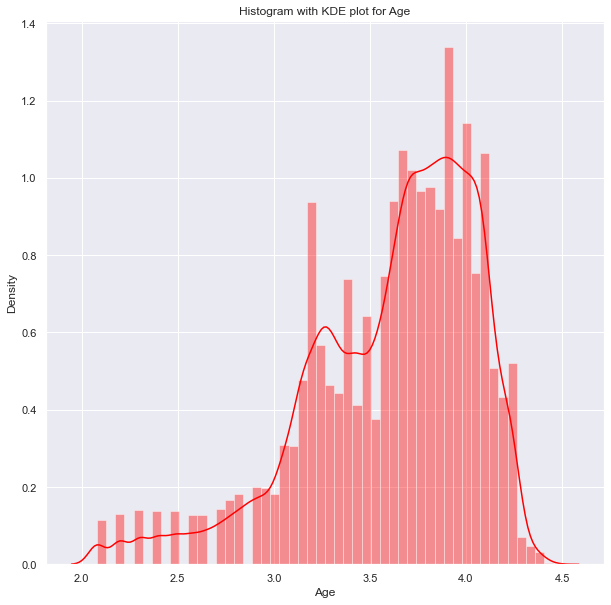


Shapiro Test for  Age, Statistics = 0.934, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Flight_Distance is -0.203944 and It is not normally distributed and has more weight in the right tail of the distribution

Kurtosis for Flight_Distance is -0.710347 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Flight_Distance is 0.915590


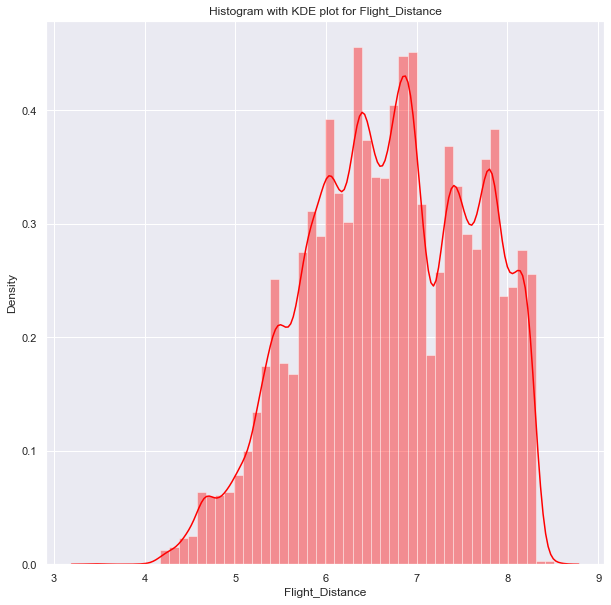


Shapiro Test for  Flight_Distance, Statistics = 0.980, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Departure_Delay_in_Minutes is 0.916564 and It is not normally distributed and has more weight in the left tail of the distribution

Kurtosis for Departure_Delay_in_Minutes is -0.557211 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Departure_Delay_in_Minutes is 1.620337


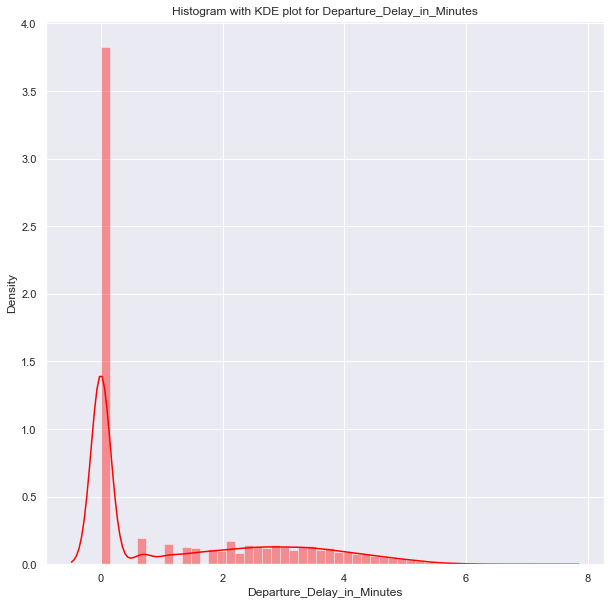


Shapiro Test for  Departure_Delay_in_Minutes, Statistics = 0.759, p = 0.000
Sample does not look Gaussian (reject H0)

SKEWNESS for Arrival_Delay_in_Minutes is 0.870637 and It is not normally distributed and has more weight in the left tail of the distribution

Kurtosis for Arrival_Delay_in_Minutes is -0.640753 and It is not normally distributed and playkurtic
\STANDARD DEVIATION for Arrival_Delay_in_Minutes is 1.632613


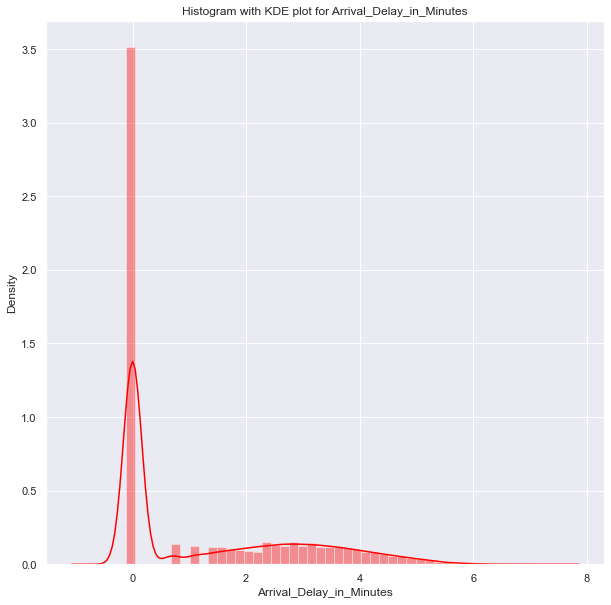


Shapiro Test for  Arrival_Delay_in_Minutes, Statistics = 0.765, p = 0.000
Sample does not look Gaussian (reject H0)


In [53]:
cnum_var          =    ['Age', 'Flight_Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']

for i in range(4):
    name          =    cnum_var[i]
    x             =    X_df[name].tolist()
    check_normality(name, x)
    # plotting histogram and density plot for each variable using distplot() by setting color
    sns.distplot(X_df[name], color='red', hist_kws={"edgecolor": 'white'})
    graph_title  =  'Histogram with KDE plot for ' + name
    plt.title(graph_title)
    # visualizing plot using matplotlib.pyplot library
    plt.show()

    # normality test
    stat, p        =    shapiro(x)
    print('\nShapiro Test for  %s, Statistics = %.3f, p = %.3f' % (name, stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
      print('Sample looks Gaussian (fail to reject H0)')
    else:
      print('Sample does not look Gaussian (reject H0)')

# Feature Scaling

The goal of applying Feature Scaling is to make sure features are on almost the same scale so that each feature is equally important and make it easier to process by most ML algorithms

In [54]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_df[var])
scaled_features = scaler.transform(X_df[var])
#Convert to table format - MinMaxScaler
X_df[var] = pd.DataFrame(data=scaled_features, columns=cnum_var)

### Observation

As the data is still not normally distributed even though value of skweness and kurtosis has
gone down by significant difference we use min max scaler instead of standard scalar.
This can help in improve performance of Logistic regression,SVM etc.

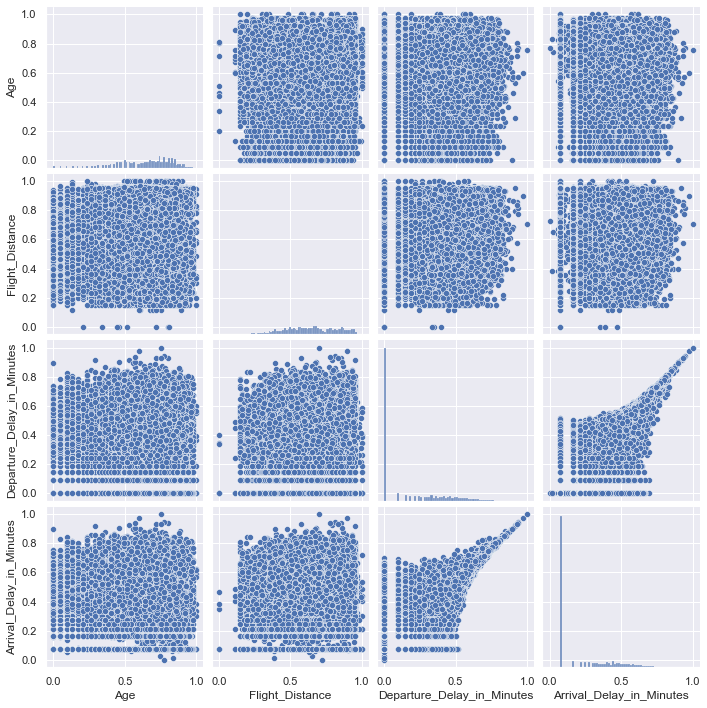

In [55]:
sns.pairplot(X_df[['Age', 'Flight_Distance','Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes','satisfaction']])
plt.show()

# Correlation Matrix

In [56]:
corr_data = pd.DataFrame(airline_passenger_satisfaction, columns= ['Age', 'Flight_Distance','Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes'])
corr =corr_data.corr()

<AxesSubplot:>

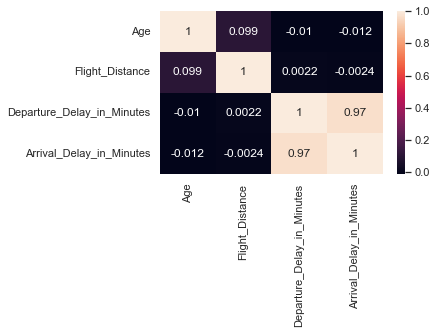

In [57]:
plt.figure(figsize = (5,3))
sns.heatmap(corr, annot= True)

In [58]:
def calc_VIF(x):
  vif= pd.DataFrame()
  vif['variables']=x.columns
  vif["VIF"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]

  return(vif)

In [59]:
x=corr_data.iloc[:,:-1]
calc_VIF(x)

,variables,VIF
0,Age,2.288654
1,Flight_Distance,2.203990
2,Departure_Delay_in_Minutes,1.128322


#### observation

The VIF is less than for 5 the continuous numerical variables, hence it is evident that muliticolinearity is absent

In [60]:
discrete_var = pd.DataFrame(airline_passenger_satisfaction, columns= ['Food_and_drink','Seat_comfort','Inflight_entertainment','Cleanliness',
                        'Inflight_wifi_service','Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service', 
                           'Gate_location', 'Departure/Arrival_time_convenient','On-board_service',
                           'Ease_of_Online_booking', 'Online_boarding' ])
discrete_var.head(2)

,Food_and_drink,Seat_comfort,Inflight_entertainment,Cleanliness,Inflight_wifi_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Gate_location,Departure/Arrival_time_convenient,On-board_service,Ease_of_Online_booking,Online_boarding
0,5,5,5,5,3,3,4,4,5,1,4,4,3,3
1,1,1,1,1,3,5,3,1,4,3,2,1,3,3


In [61]:
corr_dis = discrete_var.corr()
corr_dis

,Food_and_drink,Seat_comfort,Inflight_entertainment,Cleanliness,Inflight_wifi_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Gate_location,Departure/Arrival_time_convenient,On-board_service,Ease_of_Online_booking,Online_boarding
Food_and_drink,1.000000,0.574556,0.622512,0.657760,0.134718,0.032498,0.034746,0.087299,0.033993,-0.001159,0.004906,0.059073,0.031873,0.234468
Seat_comfort,0.574556,1.000000,0.610590,0.678534,0.122658,0.105559,0.074542,0.191854,0.069218,0.003669,0.011344,0.131971,0.030014,0.420211
Inflight_entertainment,0.622512,0.610590,1.000000,0.691815,0.209321,0.299692,0.378210,0.120867,0.404855,0.003517,-0.004861,0.420153,0.047032,0.285066
Cleanliness,0.657760,0.678534,0.691815,1.000000,0.132698,0.096370,0.095793,0.179583,0.088779,-0.003830,0.014292,0.123220,0.016179,0.331517
Inflight_wifi_service,0.134718,0.122658,0.209321,0.132698,1.000000,0.160473,0.120923,0.043193,0.110441,0.336248,0.343845,0.121500,0.715856,0.456970
Leg_room_service,0.032498,0.105559,0.299692,0.096370,0.160473,1.000000,0.369544,0.153137,0.368656,-0.005873,0.012441,0.355495,0.107601,0.123950
Baggage_handling,0.034746,0.074542,0.378210,0.095793,0.120923,0.369544,1.000000,0.233122,0.628561,0.002313,0.072126,0.519134,0.038762,0.083280
Checkin_service,0.087299,0.191854,0.120867,0.179583,0.043193,0.153137,0.233122,1.000000,0.237197,-0.035427,0.093333,0.243914,0.011081,0.204462
Inflight_service,0.033993,0.069218,0.404855,0.088779,0.110441,0.368656,0.628561,0.237197,1.000000,0.001681,0.073318,0.550782,0.035272,0.074573
Gate_location,-0.001159,0.003669,0.003517,-0.003830,0.336248,-0.005873,0.002313,-0.035427,0.001681,1.000000,0.444757,-0.028373,0.458655,0.001688


<AxesSubplot:>

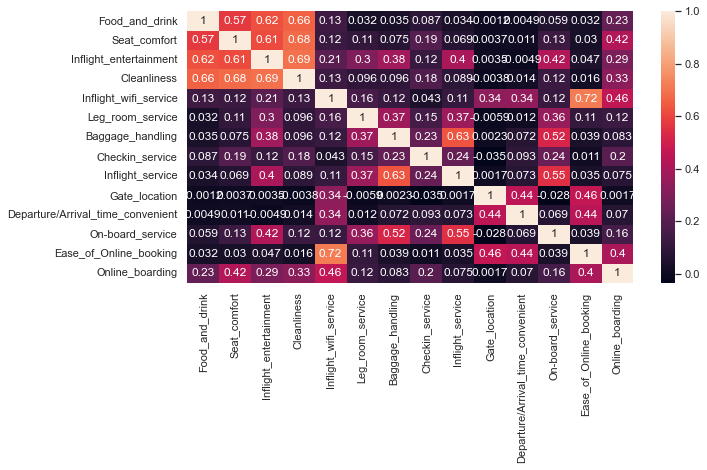

In [62]:
plt.figure(figsize = (10,5))
sns.heatmap(corr_dis, annot= True)

# Observation

From the above plot we infer that Departure_Delay_in_Minutes and Arrival_Delay_in_Minutes is highly correlated. 
**Hence, we need to remove one of them, Arrival_Delay_in_Minutes.**


## 4) EDA

In [63]:
airline_passenger_satisfaction.head(2)
# X_df.head(2)
# airline_passenger_satisfaction.dtypes

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000000,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000000,neutral or dissatisfied


## Univariate Analysis

In [64]:
# Segretgating into groups:
# continuos:
cont_var = ['Age', 'Flight_Distance', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes']

#categorical
passenger_details = ['Gender','Customer_Type']
travel_details = ['Type_of_Travel', 'Class' ]

#discrete varibles
services_provided1 = ['Food_and_drink','Seat_comfort','Inflight_entertainment','Cleanliness']
services_provided = ['Inflight_wifi_service','Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service', ]
boarding_and_arrival =  ['Gate_location', 'Departure/Arrival_time_convenient','On-board_service']
online_services = ['Ease_of_Online_booking', 'Online_boarding' ]

In [65]:
def convert(data, var_group):
    l=[]
    for j,i in enumerate(var_group):
        l.append(str(i))
    return l

In [66]:
discrete_col = airline_passenger_satisfaction.copy()

In [67]:
services_1 = convert(discrete_col, services_provided1)

In [68]:
services_2 = convert(discrete_col, boarding_and_arrival )

In [69]:
services_3 = convert(discrete_col, online_services)

In [70]:
services = convert(discrete_col, services_provided)
services

['Inflight_wifi_service',
 'Leg_room_service',
 'Baggage_handling',
 'Checkin_service',
 'Inflight_service']

In [71]:
# Custom function for Univariate analysis for continuous variables: 
def UVA_numeric(data, var_group):
  ''' 
  Univariate_Analysis_numeric
  takes a group of variables (INTEGER and FLOAT) and plot/print all the descriptives and properties along with KDE.

  Runs a loop: calculate all the descriptives of i(th) variable and plot/print it
  '''

  size = len(var_group)
  plt.figure(figsize = (7*size,3), dpi = 100)
  
  #looping for each variable
  for j,i in enumerate(var_group):
    
    # calculating descriptives of variable
    mini = data[i].min()
    maxi = data[i].max()
    ran = data[i].max()-data[i].min()
    mean = data[i].mean()
    median = data[i].median()
    st_dev = data[i].std()
    skew = data[i].skew()
    kurt = data[i].kurtosis()

    # calculating points of standard deviation
    points = mean-st_dev, mean+st_dev

    #Plotting the variable with every information
    plt.subplot(1,size,j+1)
    sns.kdeplot(x=data[i], shade=True)
    sns.lineplot(x=points, y=[0,0], color = 'black', label = "std_dev")
    sns.scatterplot(x=[mini,maxi], y=[0,0], color = 'orange', label = "min/max")
    sns.scatterplot(x=[mean], y=[0], color = 'red', label = "mean")
    sns.scatterplot(x=[median], y=[0], color = 'blue', label = "median")
    plt.xlabel('{}'.format(i), fontsize = 20)
    plt.ylabel('density')
    plt.title('within 1 std_dev = {}; kurtosis = {};\nskew = {}; range = {}\nmean = {}; median = {}'.format((round(points[0],2),round(points[1],2)),
                                                                                                   round(kurt,2),
                                                                                                   round(skew,2),
                                                                                                   (round(mini,2),round(maxi,2),round(ran,2)),
                                                                                                   round(mean,2),
                                                                                                   round(median,2)))

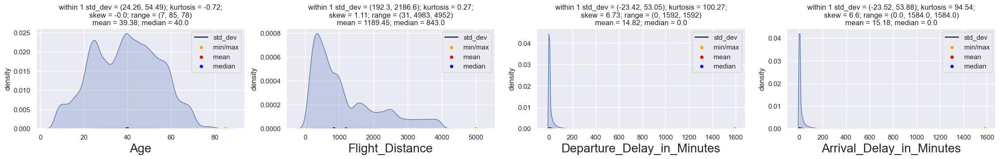

In [72]:
# Univariate for continuous varoables
UVA_numeric(airline_passenger_satisfaction, cont_var)

#### observation

1) From the above KDE plot the Averages i.e mean of ages here is around the age of 40 years There is not much children here.There is a noticeable increase in the count when we come to age 20 and there is a slight decrease after crossing the age of 20 upto the age of 40years.The peakness of the data is at the age of 40 years from which we can say that more numbers of passengers are between 39 and 49years old respectively.From age 50 we notice that the count decreases steadyly.
we can conclude that the passengers are between 20years to 60years.

2)Average of flight distances is 1190 km.  We notice that we are working on small distance flights as the count of small kilometers flights much more than others.

3)The average delay of  departure of flights is around 14 minutes.the data is right skewed and median is 0

4)The average delay of  arrival of flights is around 15 minutes.the data is right skewed and median is 0


In [73]:
# Custom function for categories and discrete columns 
def UVA_category(data, var_group):

  '''
  Univariate_Analysis_categorical
  takes a group of variables (category) and plot/print all the value_counts and barplot.
  '''
  # setting figure_size
  size = len(var_group)
  plt.figure(figsize =(12,5), dpi = 100)

  # for every variable
  for j,i in enumerate(var_group):
    norm_count = data[i].value_counts(normalize = True)
    n_uni = data[i].nunique()

  #Plotting the variable with every information
    plt.subplot(1,size,j+1)
    sns.barplot(norm_count, norm_count.index , order = norm_count.index)
    plt.xlabel('fraction/percent', fontsize = 8)
    plt.ylabel('{}'.format(i), fontsize = 8)
    plt.title('n_uniques = {} \n value counts \n {};'.format(n_uni,norm_count))

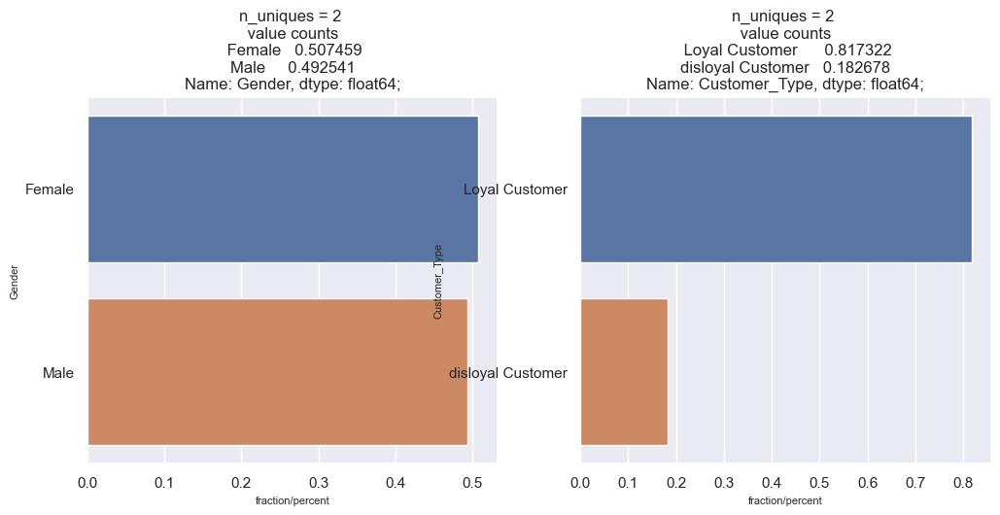

In [74]:
UVA_category(airline_passenger_satisfaction, passenger_details )

#### observation

1) The above bar plot is the plotted for the variables Gender and Customer_type vs the fraction/percentage of the variables

2) on the LHS side the gender variable has two classes male and female and we can clearly infer that there are 50% of females when compared to the males whose percentage is 49%

3) on the RHS graph we can infer that the Customer_type class is categorized into Loyal and disloyal customer and we can infer that there are around 81% of passengers who are loyal customers to the airline and only 18 % of passengers are disloyal

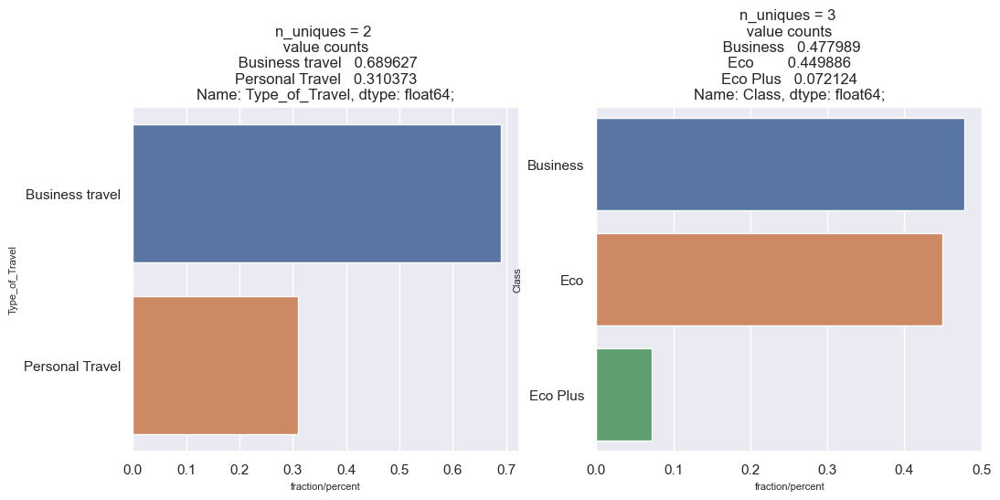

In [75]:
UVA_category(airline_passenger_satisfaction,travel_details)

#### observation

1) The above barplot is plotted for the variables Type_of_travel,class of travel and satisfaction vs percentage/fraction of the data

2) On the Type_of_Travel the variables are labeled into Personal Travel and Bussiness Travel and we can infer that most of passengers travel for Bussiness purpose which is around 68% and the percentage of apssengers those who travel for Personal purpose is at 31%

3) On the Class variable the lables are classified into Economy,Economy plus and Bussiness and we infer that the number of passengers travelling in Bussiness class is at 47% and after which the passengers prefer to travel in economy class which has a percentage of 44% and least being the economy plus class which is only 7.2% whcih concludes most of the passengers dont prefer economy plus class

4) On the Satisfaction class the label is further classified into satisfied and neutral/dissatisfied we can infer that neutral/dissatisfied passengers are at 56% when compared to satisfeid which is at 43%

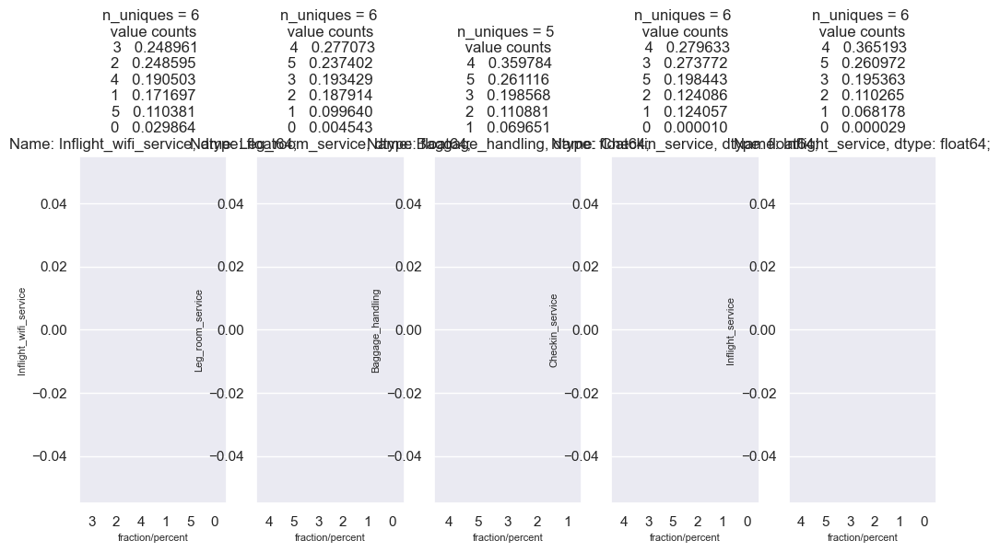

In [76]:
UVA_category(airline_passenger_satisfaction, services)

#### observation

1) The above  plot is plotted for the variables 'Inflight_wifi_service','Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service' against the diffrent levels of satisfaction

2) The satisfaction class levels are in the scale of 0 to 5 with 0 being the unsatisfied and 5 being satisfied

3) for the variable inflight_wifi_service we can infer that most of the passengers have rated for the scales 2 and 3 by which we can say that the passengers are either neutral/dissatisfied with the inflight_wifi_service.

4) for the variable leg_room_service we can infer that most of the passengers have given a rating of 4 which is at 27% from which we can conclude that the passengers are satisfied with the avalability of the legroom in the aircraft

5) for the variable baggage handling we can infer that most of the passengers have given a rating of 4 which is at 35% from which we can conclude that the passengers are satisfied with the way the baggages being handled by the airline company employees

6)for the variable 'Checkin_service' we can infer that most of the passengers have given a rating of 3 & 4 which is at 27% from which we can conclude that the passengers are somewhat satisfied with the 'Checkin_service'.

7) for the variable 'Inflight_service' we can infer that most of the passengers have given a rating of 4 which is at 36% from which we can conclude that the passengers are mostly satisfied with the inflight_service

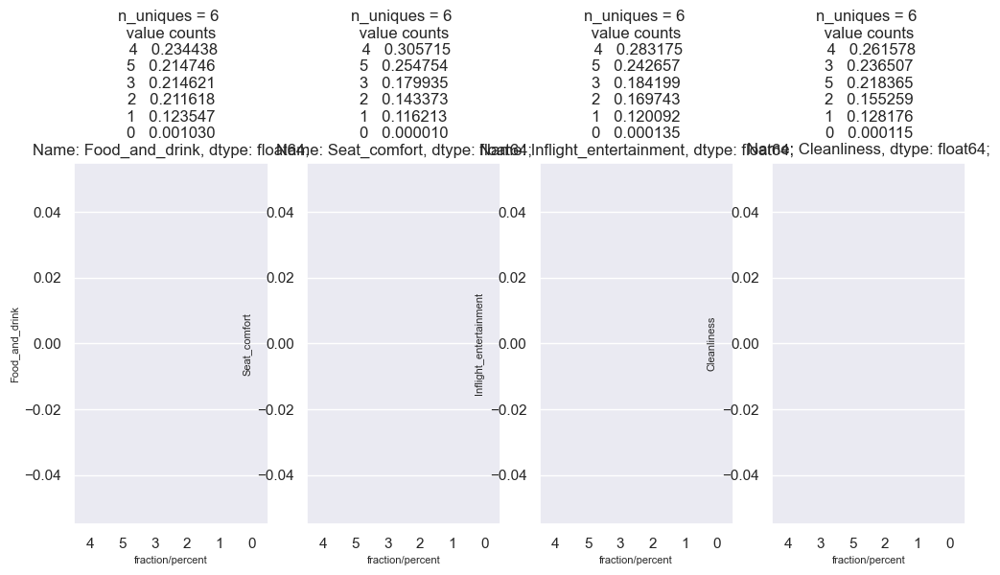

In [77]:
UVA_category(airline_passenger_satisfaction, services_1)

#### observation

1) The above plot is plotted for the variables 'Food_and_drink','Seat_comfort','Inflight_entertainment','Cleanliness' against the diffrent levels of satisfaction

2) The satisfaction class levels are in the scale of 0 to 5 with 0 being the unsatisfied and 5 being satisfied

3) for the variable 'Food_and_drink' we can infer that most of the passengers have rated for the scales 4 which is at 23% and the scales 2,3,5 are at 21% from which we ca conclude that passengers are neutral with the level of 'Food_and_drink'offered

4) for the variable 'Seat_comfort' we can infer that most of the passengers have given a rating of 4 which is at 30% from which we can conclude that the passengers are satisfied with the level of seat_comfort in the aircraft

5) for the variable 'Inflight_entertainment' we can infer that most of the passengers have given a rating of 4 which is at 28% from which we can conclude that the passengers are somewhat satisfied with the inflight_entertainment offered in the aircraft.

6)for the variable 'Cleanliness' we can infer that most of the passengers have given a rating of 4 which is at 26% from which we can conclude that the passengers are somewhat satisfied with the 'Cleanliness'.

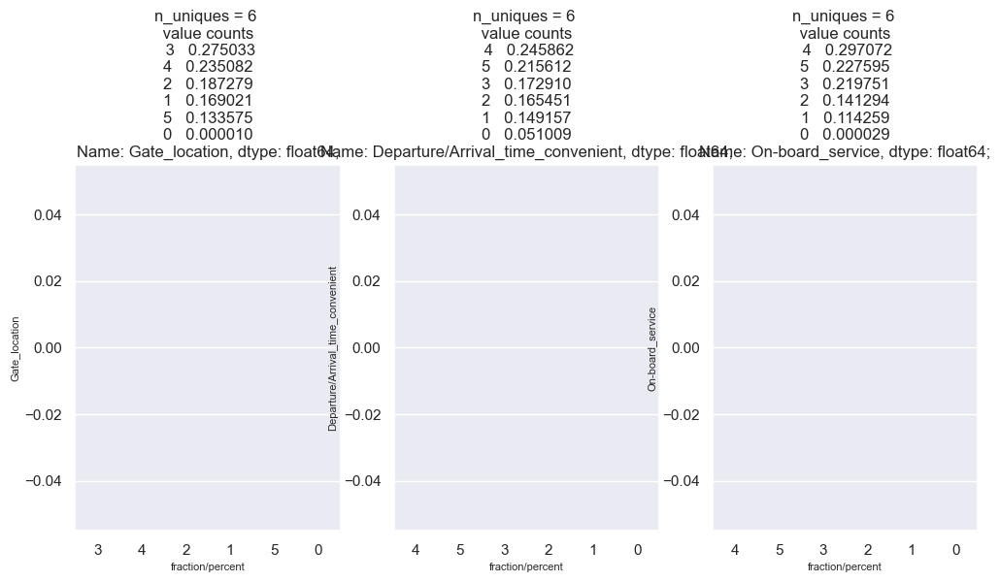

In [78]:
UVA_category(airline_passenger_satisfaction, services_2)

#### observation

1) The above plot is plotted for the variables 'Gate_location', 'Departure/Arrival_time_convenient','On-board_service' against the diffrent levels of satisfaction

2) The satisfaction class levels are in the scale of 0 to 5 with 0 being the unsatisfied and 5 being satisfied

3) for the variable 'Gate_location' we can infer that most of the passengers have rated for the scales 3 which is at 27% and the scales 2,3,4 also have significant proportions from which we can conclude that passengers are neutral with the 'Gate_location'

4) for the variable 'Departure/Arrival_time_convenient' we can infer that most of the passengers have given a rating of 4 which is at 24% from which we can conclude that the passengers are satisfied with the 'Departure/Arrival_time_convenient'

5) for the variable 'On-board_service' we can infer that most of the passengers have given a rating of 4 which is at 29% from which we can conclude that the passengers are somewhat satisfied with the On-board_service offered in the aircraft.

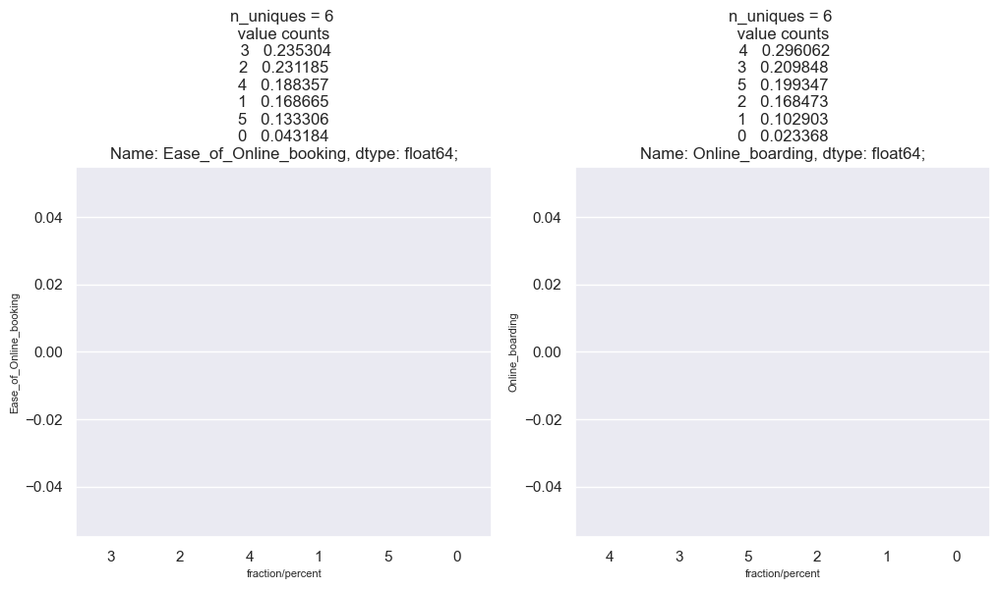

In [79]:
UVA_category(airline_passenger_satisfaction, services_3)

#### observation

1) The above plot is plotted for the variables 'Ease_of_Online_booking', 'Online_boarding' against the diffrent levels of satisfaction

2) The satisfaction class levels are in the scale of 0 to 5 with 0 being the unsatisfied and 5 being satisfied

3) for the variable 'Ease_of_Online_booking' we can infer that most of the passengers have rated for the scales 2 & 3 which are at 23% from which we can conclude that the passengers are either neutral/dissatisfied with the 'Ease_of_Online_Booking'

4) for the variable 'Online_boarding' we can infer that most of the passengers have given a rating of 4 which is at 29% from which we can conclude that the passengers are somewhat satisfied with the 'Online_boarding'

## Bivaraite Analysis

In [80]:
airline_passenger_satisfaction.head(2)

,Gender,Customer_Type,Age,Type_of_Travel,Class,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000000,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000000,neutral or dissatisfied


In [81]:
#categorical
passenger_details = ['Gender','Customer_Type']
travel_details = ['Type_of_Travel', 'Class' ]

#discrete varibles
services_provided1 = ['Food_and_drink','Seat_comfort','Inflight_entertainment','Cleanliness']
services_provided = ['Inflight_wifi_service','Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service', ]
boarding_and_arrival =  ['Gate_location', 'Departure/Arrival_time_convenient','On-board_service']
online_services = ['Ease_of_Online_booking', 'Online_boarding' ]

In [82]:
correlation = corr_data.dropna().corr()
correlation

,Age,Flight_Distance,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes
Age,1.000000,0.099838,-0.010150,-0.012147
Flight_Distance,0.099838,1.000000,0.001906,-0.002426
Departure_Delay_in_Minutes,-0.010150,0.001906,1.000000,0.965481
Arrival_Delay_in_Minutes,-0.012147,-0.002426,0.965481,1.000000


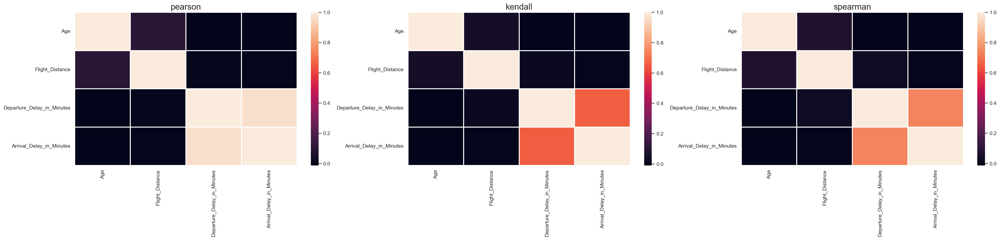

In [83]:
# plotting heatmap usill all methods for all numerical variables
plt.figure(figsize=(36,6), dpi=140)
for j,i in enumerate(['pearson','kendall','spearman']):
  plt.subplot(1,3,j+1)
  correlation = corr_data.dropna().corr(method=i)
  sns.heatmap(correlation, linewidth = 2)
  plt.title(i, fontsize=18)

#### observation

1) The above correlation plot we can infer that we have plotted the correlation matrix using 'pearson','kendall','spearman'methods and out of these three methods we can infer that 'pearson'method gives a good observation 

2) 'Kendall' and 'spearman'gives a high correlation between the numerical variables when compared to the 'pearson' method so we can reject the 'Kendall' and 'spearman' methods

#### count plot for the variable Gender Vs the Target variable Satisfaction

Text(0, 0.5, 'Count')

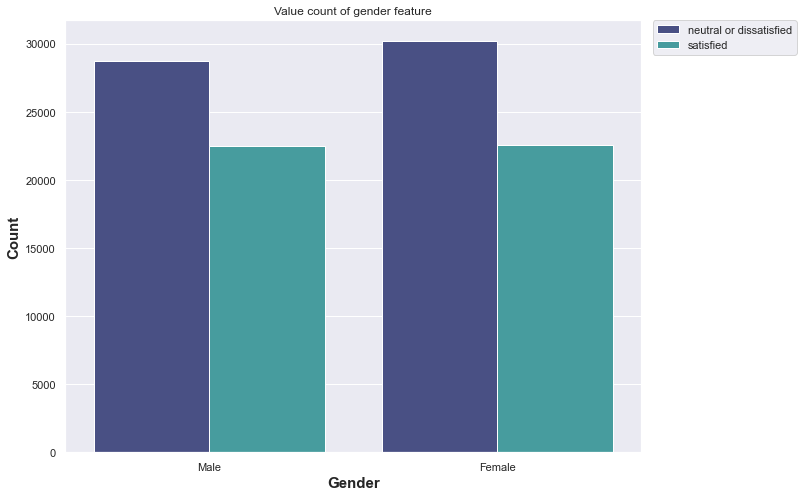

In [84]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
sns.countplot(data = airline_passenger_satisfaction, x = 'Gender', hue = 'satisfaction', palette='mako')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Value count of gender feature')
ax.set_xlabel("Gender",fontsize=15, weight='semibold')
ax.set_ylabel("Count",fontsize=15, weight='semibold')

#### observation

1) The above count plot is plotted for the variable gender against the target variable satisfaction

2) in this plot the variable gnender has two labels male and female and the target variable satisfaction has tow labels satisfeiid and disatissfied and neutral

3) For the label male in the variable gender we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied

4) For the label Female in the variable gender we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied

5) we can also infer that the number of female passenger is higher than the number of the male passengers

Text(0, 0.5, 'Count')

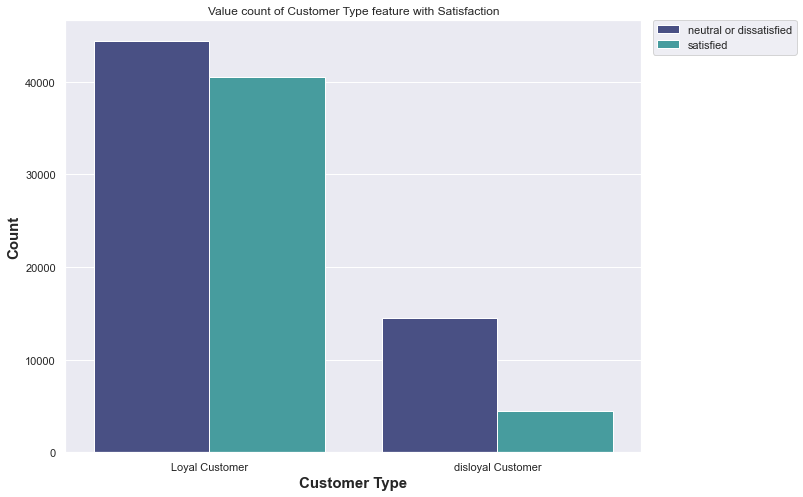

In [85]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
sns.countplot(data =airline_passenger_satisfaction , x = 'Customer_Type', hue = 'satisfaction', palette='mako')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Value count of Customer Type feature with Satisfaction')
ax.set_xlabel("Customer Type",fontsize=15, weight='semibold')
ax.set_ylabel("Count",fontsize=15, weight='semibold')


#### observation

1) The above count plot is plotted for the variable customer type against the target variable satisfaction

2) in this plot the variable customer type  has two labels loyal customer  and disloyal customer and the target variable satisfaction has tow labels satisfeiid and disatissfied and neutral

3) For the loyal customer in the variable customer type  we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied

4) For the label disloyal customer  in the variable customer type we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied



Text(0, 0.5, 'Count')

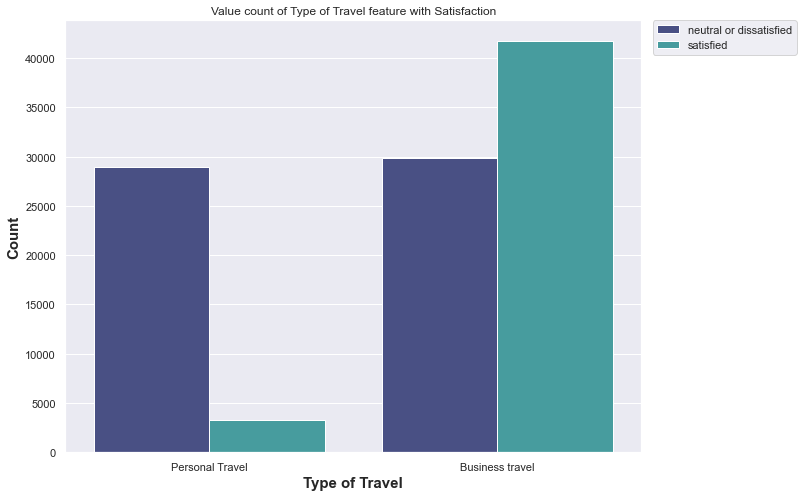

In [86]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
sns.countplot(data = airline_passenger_satisfaction, x = 'Type_of_Travel', hue = 'satisfaction', palette='mako')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Value count of Type of Travel feature with Satisfaction')
ax.set_xlabel("Type of Travel",fontsize=15, weight='semibold')
ax.set_ylabel("Count",fontsize=15, weight='semibold')

#### observation

1) The above count plot is plotted for the variables type of travel versus the target variable satisfaction

2) Here the type of travel variable has two labels personal travel and Busssiness Travel and the target variable satisfacction has two labels satisfied and dissatisfied/neutral 

3) For the personal travel in the variable type of travel we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied

4) For the Bussiness Travel in the variable type of travel we can see that the number of satisfied passenger is higher than the number of passengers those who are dissatisfied/neutral

5) we can also infer that the passengers those who travel for bussiness purpose is high than that of the passengers those who travel for personal purpose

Text(0, 0.5, 'Count')

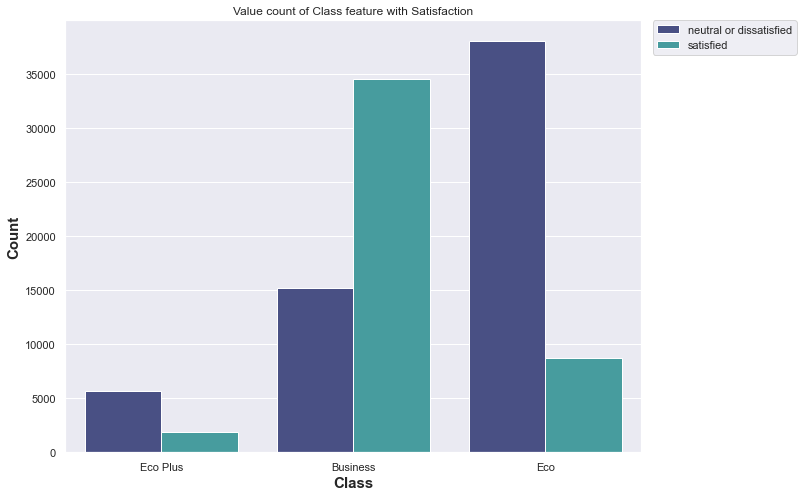

In [87]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
sns.countplot(data = airline_passenger_satisfaction, x = 'Class', hue = 'satisfaction', palette='mako')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Value count of Class feature with Satisfaction')
ax.set_xlabel("Class",fontsize=15, weight='semibold')
ax.set_ylabel("Count",fontsize=15, weight='semibold')

#### observation

1) The above count plot is plotted for the variables class versus the target variable satisfaction

2) Here the class variable has three labels Economy,Economyplus and Bussiness  and the target variable satisfacction has two labels satisfied and dissatisfied/neutral

3) For the Eco plus in the variable class we can see that the number of neutral/disatissfied is higher than the number of passengers those who are satisfied

4) For the Economy class in the variable class we can see that the number of neutral/disatissfied passenger is higher than the number of passengers those who are satisfied

5) For the Bussiness class in the variable class we can see that the number of satissfied passenger is higher than the number of passengers those who are dissatisfied/neutral



Text(0, 0.5, 'Count')

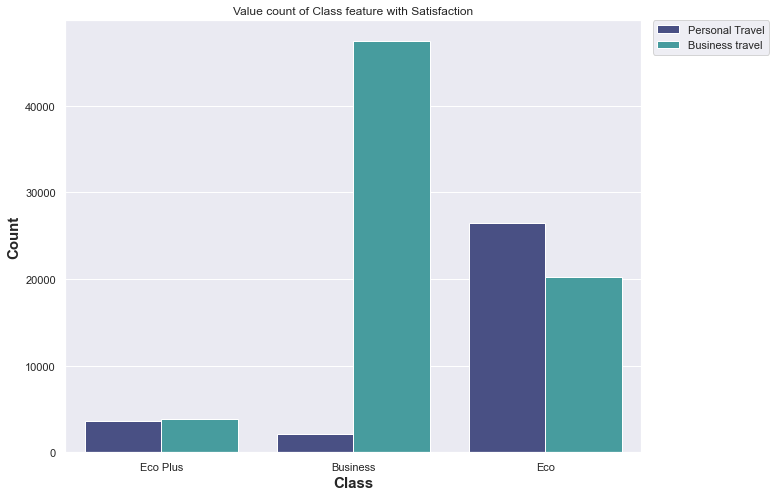

In [88]:
fig = plt.figure(figsize=(8,6))
ax = fig.add_axes([0,0,1,1])
sns.countplot(data = airline_passenger_satisfaction, x = 'Class', hue = 'Type_of_Travel', palette='mako')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('Value count of Class feature with Satisfaction')
ax.set_xlabel("Class",fontsize=15, weight='semibold')
ax.set_ylabel("Count",fontsize=15, weight='semibold')

#### observation

1) The above count plot is plotted for the variables class versus the type of travel

2) Here the class variable has three labels Economy,Economyplus and Bussiness and the type of travel has two variables Personal travel and Nussiness travel

3) For the Eco plus in the variable class we can see that the number of passenger those who traveled for persoanl purpose and bussiness purpose has a marginal difference

4) For the Economy class in the variable class we can see that the number of passenger who traveled for personal purpose is high when compared to the passenger those who travelled for bussiness purpose

5) For the Bussiness class in the variable class we can see that the number of passengers those who travelled for bussiness purpose is very high when compard to the passengers those who travelled for personal purpose



In [89]:
cat_col = pd.DataFrame(airline_passenger_satisfaction, columns=['Gender','Customer_Type', 'Type_of_Travel',
                                                                'Class','satisfaction' ])
cat_col.head(2)

,Gender,Customer_Type,Type_of_Travel,Class,satisfaction
0,Male,Loyal Customer,Personal Travel,Eco Plus,neutral or dissatisfied
1,Male,disloyal Customer,Business travel,Business,neutral or dissatisfied


In [90]:
def BVA_categorical_plot(data, tar, cat):
  '''
  take data and two categorical variables,
  calculates the chi2 significance between the two variables 
  and prints the result with countplot & CrossTab
  '''
  #isolating the variables
  data = data[[cat,tar]][:]

  #forming a crosstab
  table = pd.crosstab(data[tar],data[cat],)
  f_obs = np.array([table.iloc[0][:].values,
                    table.iloc[1][:].values])

  #performing chi2 test
  from scipy.stats import chi2_contingency
  chi, p, dof, expected = chi2_contingency(f_obs)
  
  #checking whether results are significant
  if p<0.05:
    sig = True
  else:
    sig = False

  #plotting grouped plot
  sns.countplot(x=cat, hue=tar, data=data)
  plt.title("p-value = {}\n difference significant? = {}\n".format(round(p,8),sig))

  #plotting percent stacked bar plot
  #sns.catplot(ax, kind='stacked')
  ax1 = data.groupby(cat)[tar].value_counts(normalize=True).unstack()
  ax1.plot(kind='bar', stacked='True',title=str(ax1))
  int_level = data[cat].value_counts()

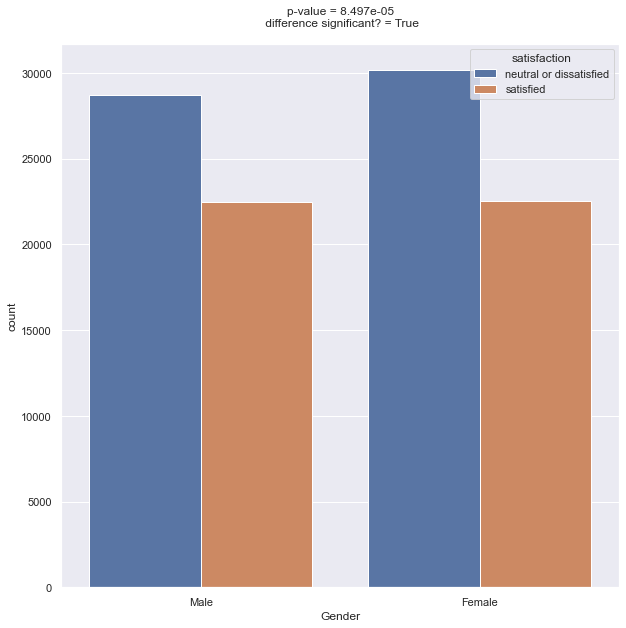

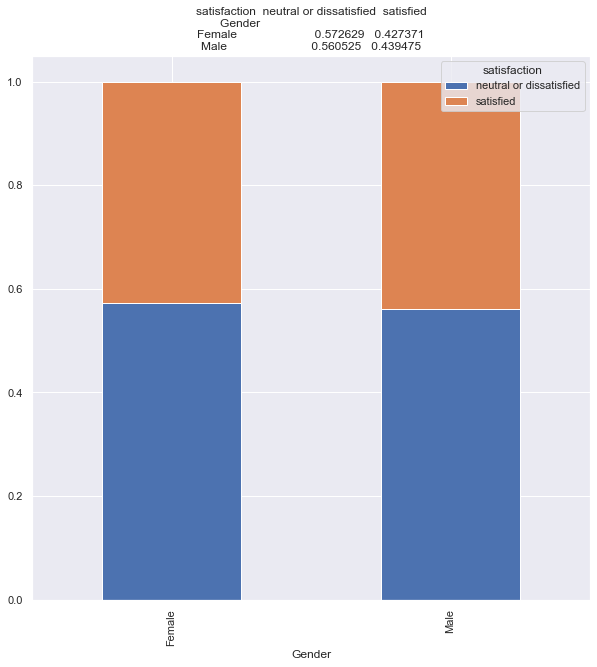

In [91]:
BVA_categorical_plot(cat_col, 'satisfaction','Gender')

#### observation

1) The above bar plot is plotted for the variable Gender versus the target variable satisfaction

2) The variable Gender has two classes Male and Female and the target variable has two labels satisfied,neutral/dissatisfied

3) For the Female label for the variable Gender we can infer that around 57% of the passenegers are either neutral/dissatisfied and only 42% of the passengers are satisfied

4)For the male label for the variable Gender we can infer that around 56% of the passenegers are either neutral/dissatisfied and only 43% of the passengers are satisfied

5) we can also infer that the ratio of passengers those who are dissatisifed/neutral is higher than passengers those who are satisfied and also the number of female passengers is high when compared to the male passengers


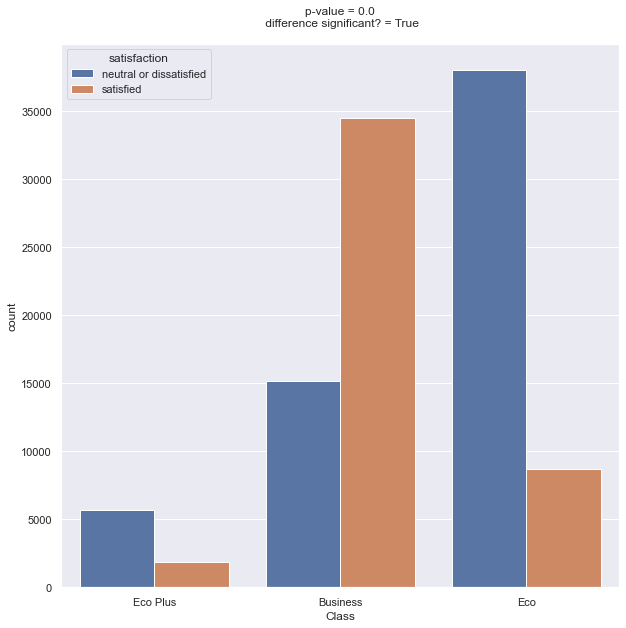

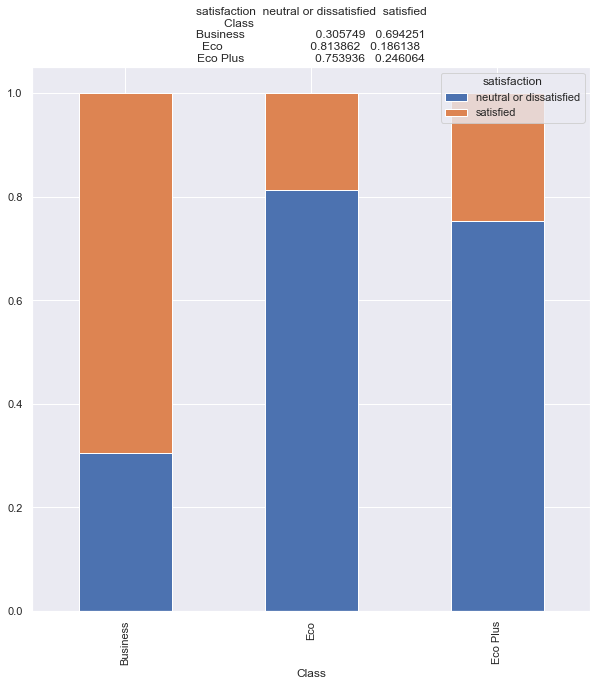

In [92]:
BVA_categorical_plot(cat_col, 'satisfaction','Class')

#### observation

1) The above bar plot is plotted for the variables class versus the target variable satisfaction

2) Here the class variable has three labels Economy,Economyplus and Bussiness and the target variable satisfacction has two labels satisfied and dissatisfied/neutral

3) For the Eco plus in the variable class we can see that the number of neutral/disatissfied is at 75% which is very high than the number of passengers those who are satisfied which at 24%

4) For the Economy class in the variable class we can see that the number of neutral/disatissfied passenger is at 81% which is very high than the number of passengers those who are satisfied which is at 18%

5) For the Bussiness class in the variable class we can see that the number of satissfied passenger is at 69% which is very high than the number of passengers those who are dissatisfied/neutral which is at 30%

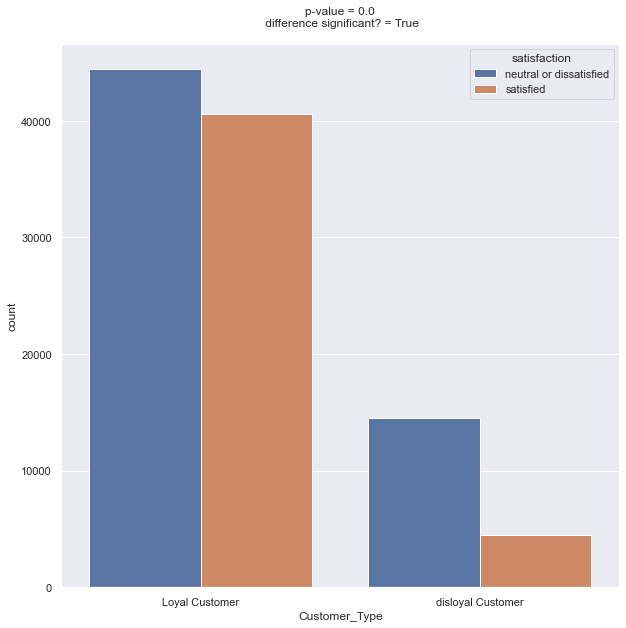

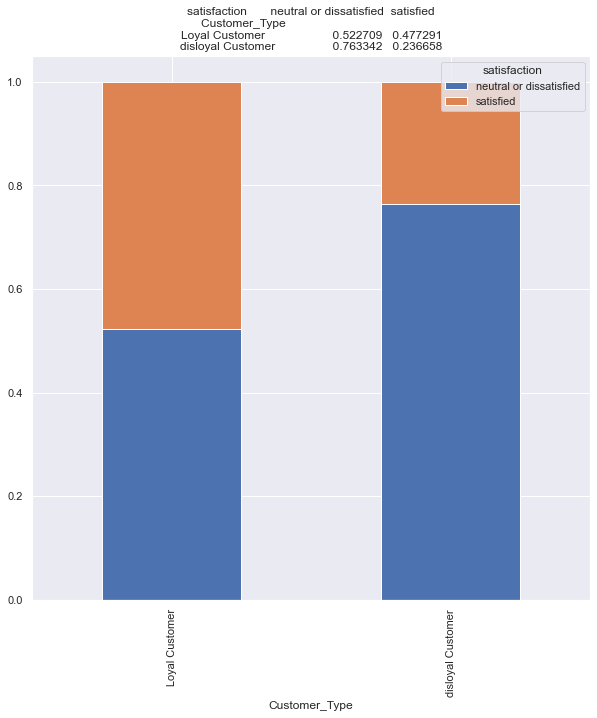

In [93]:
BVA_categorical_plot(cat_col, 'satisfaction','Customer_Type')

#### observation

1) The above bar plot is plotted for the variable customer type against the target variable satisfaction

2) in this plot the variable customer type has two labels loyal customer and disloyal customer and the target variable satisfaction has tow labels satisfeiid and disatissfied and neutral

3) For the loyal customer in the variable customer type we can see that the number of neutral/disatissfied is at 52% which is higher than the number of passengers those who are satisfied which is at 47%

4) For the label disloyal customer in the variable customer type we can see that the number of neutral/disatissfied is at 76% which is very high than the number of passengers those who are satisfied which is at 23%

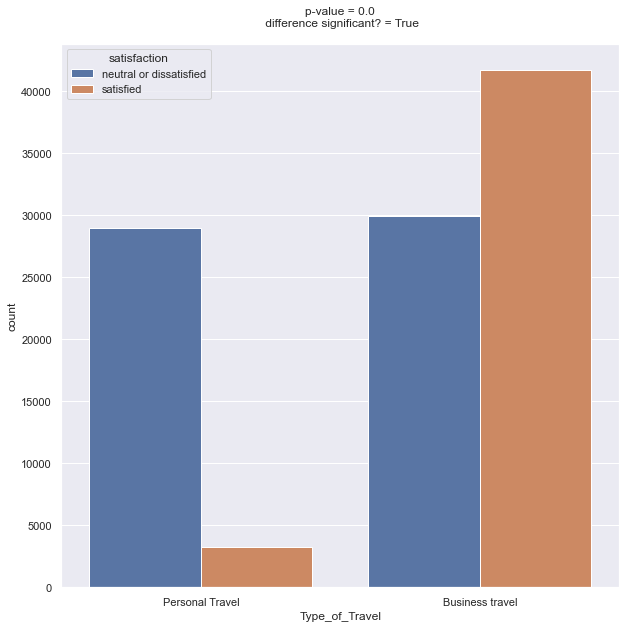

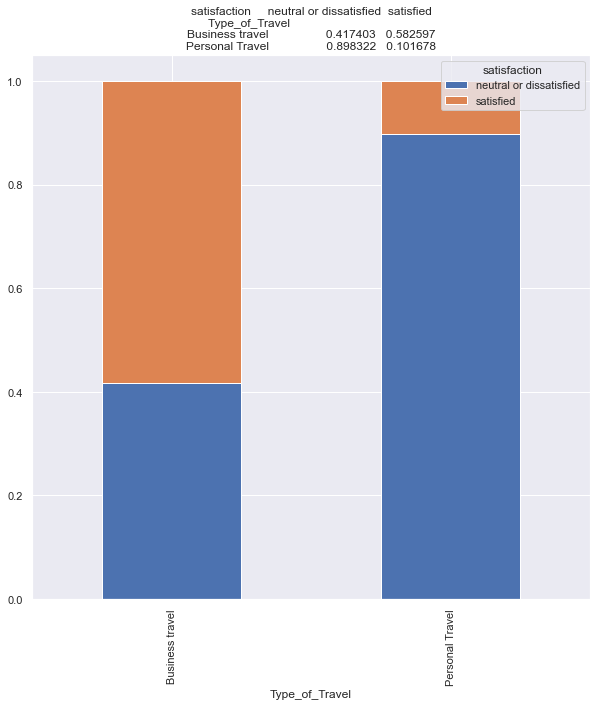

In [94]:
BVA_categorical_plot(cat_col, 'satisfaction','Type_of_Travel')

#### observation

1) The above count plot is plotted for the variables type of travel versus the target variable satisfaction

2) Here the type of travel variable has two labels personal travel and Busssiness Travel and the target variable satisfacction has two labels satisfied and dissatisfied/neutral

3) For the personal travel in the variable type of travel we can see that the number of neutral/disatissfied is at 89% which is very high than the number of passengers those who are satisfied which is at 10%

4) For the Bussiness Travel in the variable type of travel we can see that the number of satisfied passenger is at 58% which is higher than the number of passengers those who are dissatisfied/neutral which is at 41%


In [95]:
# #perform the Chi-Square Test of Independence
# from scipy.stats import chi2_contingency 


  
# # defining the table

# stat, p, dof, expected = chi2_contingency(cat_col)
  
# # interpret p-value
# alpha = 0.05
# print("p value is " + str(p))
# if p <= alpha:
#     print('Dependent (reject H0)')
# else:
#     print('Independent (H0 holds true)')

## Multivariate Analysis

### 4.1 Satisfaction of Airline passengers Vs Online_boarding, Customer_type & Class

 Online_Boarding, Customer_type_code & Class Vs Satisfaction of Airline Passengers


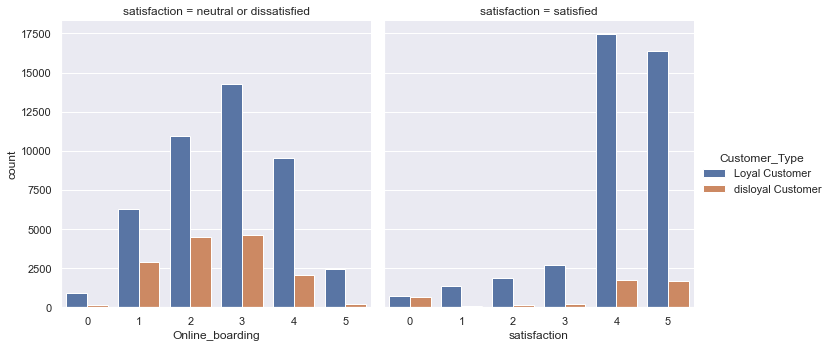

In [96]:
titlex = ' Online_Boarding, Customer_type_code & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Online_boarding', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

### Inference

1) From the above count plot graph we are plotting Online_boarding,customer_type_code vs satisfaction variables

2) Here Online_Boarding is the predictor  variable and satisfaction column is the target variable

3) The satisfaction ratings are rated from 0 to 5 where 0 is dissatisfied or neutral and 5 is satisfied

4) from the graph we can infer that disloyal customers are highly disatisfied and neutral whereas the loyal customers are highly satisfied

 Online_Boarding,Class Vs Satisfaction of Airline Passengers


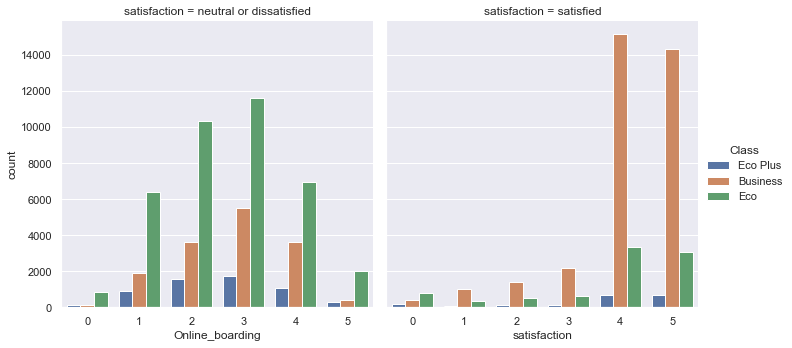

In [97]:
titlex = ' Online_Boarding,Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Online_boarding', col = 'satisfaction',\
            hue = 'Class', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

### Inference

1) From the above count plot graph we are plotting Online_boarding,class vs satisfaction variables

2) Here Online_Boarding is the predictor variable and satisfaction column is the target variable

3) The satisfaction ratings are rated from 0 to 5 where 0 is dissatisfied or neutral and 5 is satisfied

4) from the graph we can infer that Buisness class is highly satisfied and Economy class is more dissatified with Online boarding. 

 Online_Boarding, Customer_type_code & Class Vs Satisfaction of Airline Passengers


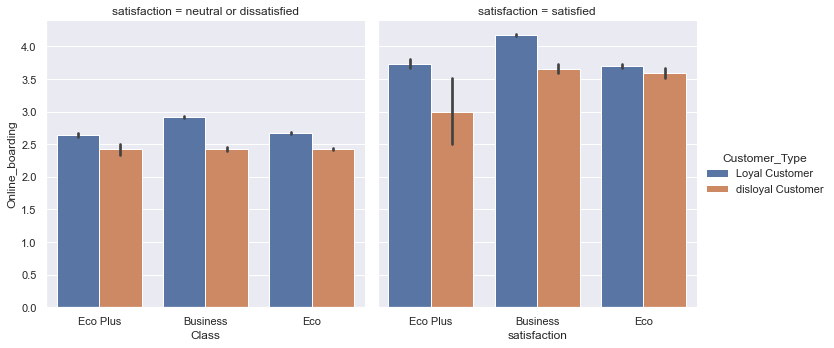

In [98]:
titlex = ' Online_Boarding, Customer_type_code & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  y = 'Online_boarding',x='Class', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'bar')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

From graph we can infer Loyal Buisness Class is more dissatisfied or neutral for Online Boarding
whereas Loyal customer of Buisness class are overal highly satisfied in comparison to other customers and also Eco plus class customer who are not loyal are least satisfied 

### 4.2 Satisfaction of Airline passengers Vs Inflight_wifi_service, Customer_type & Class

Inflight_wifi_service , Customer_type & Class Vs Satisfaction of Airline Passengers


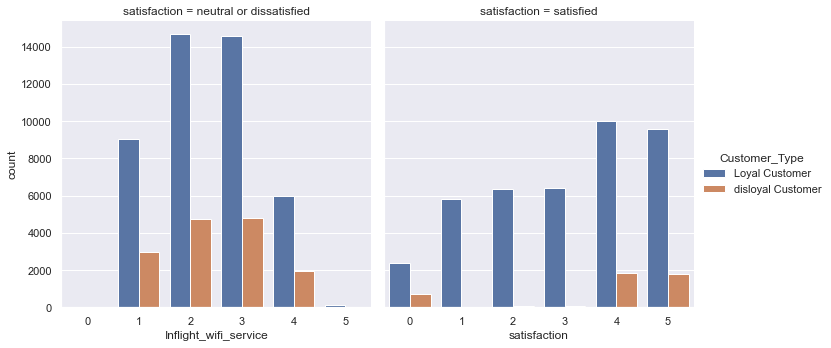

In [99]:
titlex = 'Inflight_wifi_service , Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Inflight_wifi_service', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

### Inference

1) From the above count plot graph we are plotting Inflight_wifi_service,customer_type & class vs satisfaction variables

2) Here Inflight_wifi_service is the predictor  variable and satisfaction column is the target variable

3) The satisfaction ratings are rated from 0 to 5 where 0 is dissatisfied or neutral and 5 is satisfied

4) from the graph we can infer that loyal customers are highly disatisfied or neutral in comparision with the disloyal customers

Inflight_wifi_service Class Vs Satisfaction of Airline Passengers


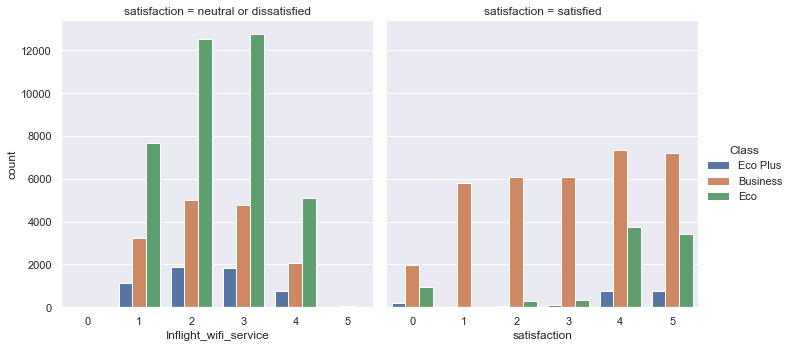

In [100]:
titlex = 'Inflight_wifi_service Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Inflight_wifi_service', col = 'satisfaction',\
            hue = 'Class', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

From graph, we can infer for all class type customers initially with increase in count dissatisfaction lvl 
for inflight wifi service was increasing amongst all classes eco has high count in neutral category 
Also, Buisness class has highest lvl of satisfaction.

Inflight_wifi_service , Customer_type & Class Vs Satisfaction of Airline Passengers


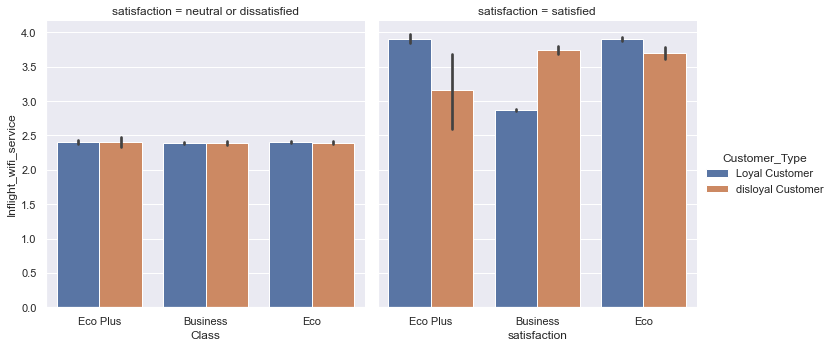

In [101]:
titlex = 'Inflight_wifi_service , Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  y = 'Inflight_wifi_service', x='Class',col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'bar')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

From graph we can infer all customer type of each class has neutral satisfction lvls also loyal customers of both class types are higly satisfied in comparison to loyal customers of Buisness class


### 4.3 Satisfaction of Airline passengers Vs Type_of_Travel, Customer_type & Class

Type_of_Travel , Customer_type & Class Vs Satisfaction of Airline Passengers


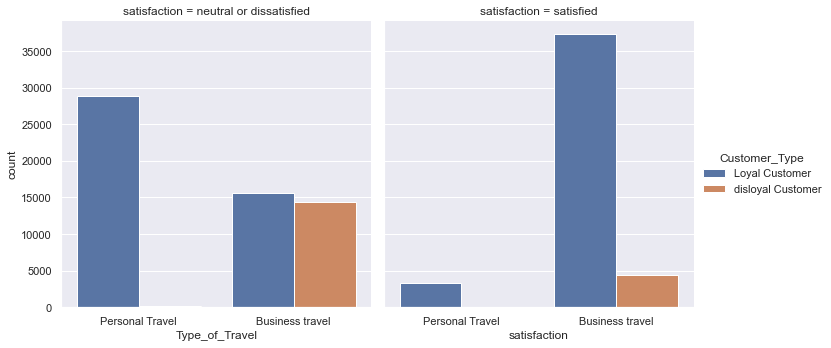

In [102]:
titlex = 'Type_of_Travel , Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Type_of_Travel', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

1) From the above count plot graph we are plotting Inflight_wifi_service,customer_type & class vs satisfaction variables

2) Here Type_of_Travel is the predictor  variable and satisfaction column is the target variable

3) on the LHS side graph we can see that the loyal customers who are travelling for personal purpose are highly dissatisfied or neutral when compared to loyal and disloyal customers doing businness travel

4) on the RHS side graph we can see that customers who are travelling for bussiness purpose are highly satisfied and are loyal customers and there are only very little amount of disloyal customers and customers who are travelling for personal purpose

Type_of_Travel , Customer_type & Class Vs Satisfaction of Airline Passengers


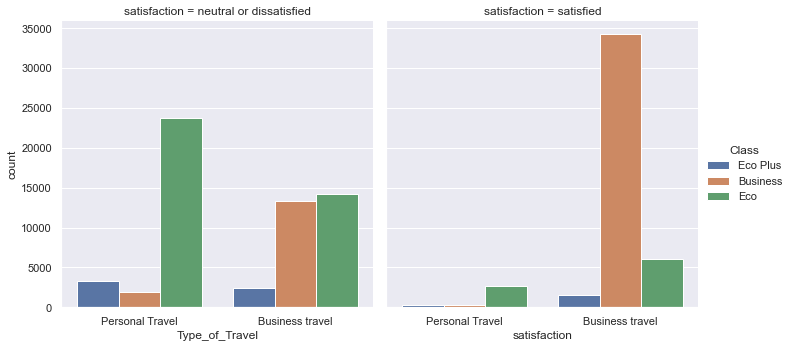

In [103]:
titlex = 'Type_of_Travel , Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Type_of_Travel', col = 'satisfaction',\
            hue = 'Class', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

###  Inference

1) From the above count plot graph we are plotting Inflight_wifi_service,customer_type & class vs satisfaction variables

2) Here Type_of_Travel is the predictor  variable and satisfaction column is the target variable

3) on the LHS side graph we can see that the loyal customers who are travelling for personal purpose are highly dissatisfied or neutral when compared to loyal and disloyal customers doing businness travel

4) on the RHS side graph we can see that customers who are travelling for bussiness purpose are highly satisfied and are loyal customers and there are only very little amount of disloyal customers and customers who are travelling for personal purpose

### 4.4 Satisfaction of Airline passengers Vs Inflight_entertainment, Customer_type & Class

Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers


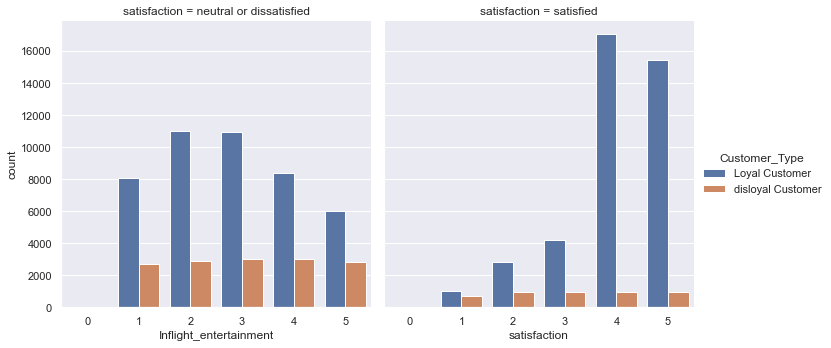

In [104]:
titlex = 'Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Inflight_entertainment', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers


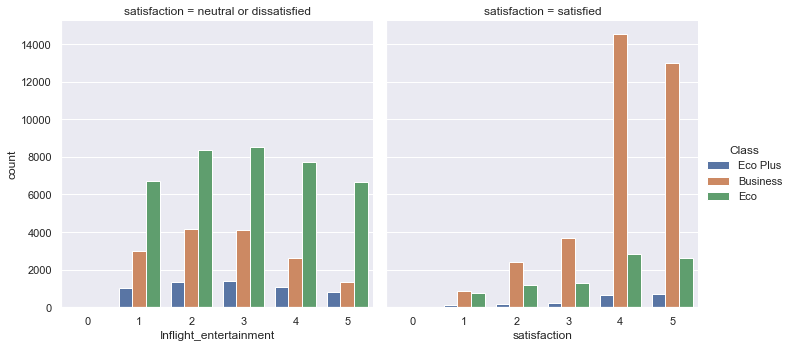

In [105]:
titlex = 'Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Inflight_entertainment', col = 'satisfaction',\
            hue = 'Class', kind = 'count')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers


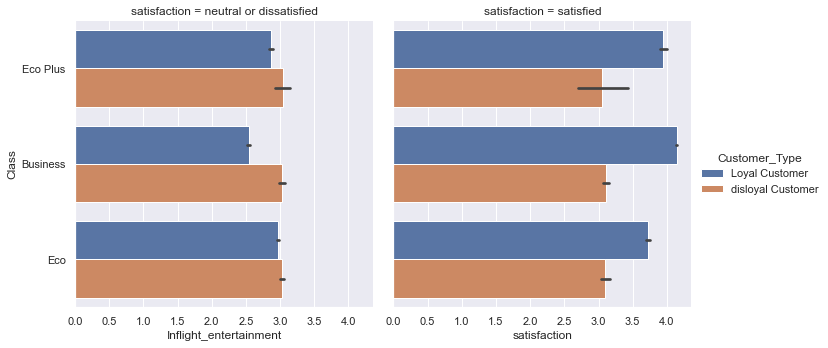

In [106]:
titlex = 'Inflight_entertainment, Customer_type & Class Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction,  x = 'Inflight_entertainment',y='Class', col = 'satisfaction',\
            hue = 'Customer_Type', kind = 'bar')
print(titlex)
plt.xlabel('satisfaction')
plt.show()

### Inference

1) From the above count plot graph we are plotting Inflight_entertainment,customer_type & class vs satisfaction variables

2) Here Inflight_entertainment,customer_type & class is the predictor  variable and satisfaction column is the target variable

3) on the LHS side graph we can infer that loyal customers are more dissatisfied or neutral when compared to disloyal customers

4) on the RHS side graph we can infer that loyal customers are more satisfied when compared to disloyal customers

### 4.5 Satisfaction of Airline passengers Vs Age, Gender & Class

Age, Gender Vs Satisfaction of Airline Passengers


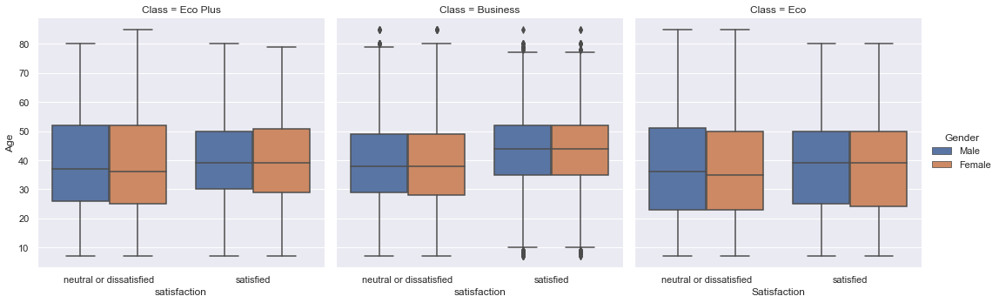

In [107]:
titlex = 'Age, Gender Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction, x = 'satisfaction', y = 'Age', col = 'Class', hue = 'Gender', kind = 'box')
print(titlex)
plt.xlabel('Satisfaction')
plt.ylabel('Age')
plt.show()

### Inference

1) The above boxplot is plotted on predictor variables Age,Gender vs the target variable Satisfaction

2) The graph also represents the different classes of travel Economy,Economy plus and Bussiness and the gender of the passengers with their age

3) on the economy plus class the number of passengers in both gender who are neutral or dissatisfied is high when compared to the satisfied passengers . The median lies between the age group between 35 to 40 in the case of neutral or dissatisfied passengers and the median for the satisfied passengers lies between the age group roughly around 38 - 40

4) on the bussiness class the number of passengers in both gender who are neutral or dissatisfied is high when compared to the satisfied passengers . The median lies between the age group between 35 to 40 in the case of neutral or dissatisfied passengers
and the median for the satisfied passengers lies between the age group 40 - 50 . There are outliers in both the netural or dissatisfied and satisfied customers 

5)on the economy class the number of passengers in both gender who are neutral or dissatisfied is minimal when compared to the satisfied passengers . The median lies between the age group between 35 to 40 in the case of neutral or dissatisfied passengers and the median for the satisfied passengers lies between the age group roughly around 38 - 40



### 4.6 Satisfaction of Airline passengers Vs Flight Distance, Gender & Class

Flight_Distance, Class Vs Satisfaction of Airline Passengers


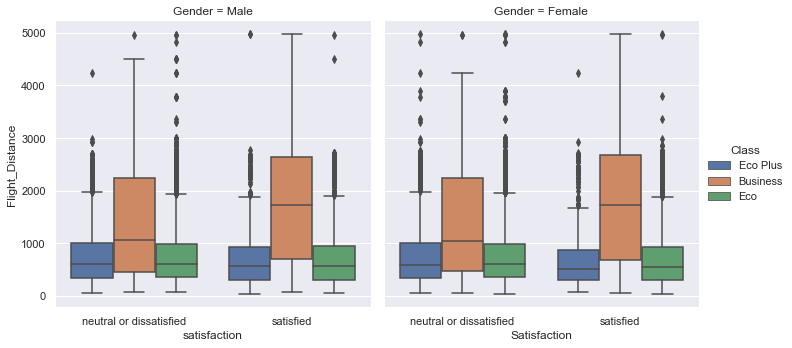

In [108]:
sns.catplot(data = airline_passenger_satisfaction, x = 'satisfaction', y = 'Flight_Distance', col = 'Gender',\
            hue = 'Class', kind = 'box')
titlex =  'Flight_Distance, Class Vs Satisfaction of Airline Passengers'
print(titlex)
plt.xlabel('Satisfaction')
plt.ylabel('Flight_Distance')
plt.show()

### Inference

1) The above boxplot is plotted on predictor variables Flight_distance,class vs the target variable Satisfaction here the passengers are also classifiedd based on their gender 

2) For the Males there is no difference or slight difference in the Economy plus and Economy class and the median for flight distance lies between 0 to 1000  and there are outliers as well. Whereas in the bussiness class there is a significant level of difference the flight distance median for neutral or dissatisfied passengers is in between 1000 to 2000  whereas for the satisfied the flight distance median is between 1700 to 2000 there are outliers in the neutral or dissatisfied variables

3)For the Females there is no difference or slight difference in the Economy plus and Economy class and the median for flight distance lies between 0 to 1000  and there are outliers as well. Whereas in the bussiness class there is a significant level of difference the flight distance median for neutral or dissatisfied passengers is in between 1000 to 2000  whereas for the satisfied the flight distance median is between 1700 to 2000 there are outliers in the neutral or dissatisfied variables


### 4.7 Satisfaction of Airline passengers Vs Flight Distance, Type_of_Travel & Gender

Flight_Distance, Type_of_Travel Vs Satisfaction of Airline Passengers


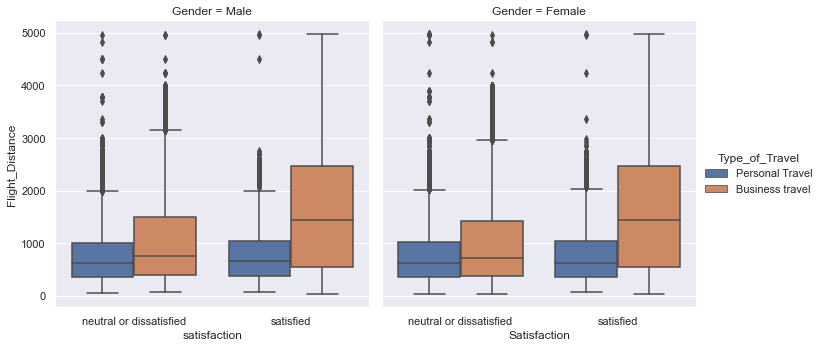

In [109]:
titlex  =  'Flight_Distance, Type_of_Travel Vs Satisfaction of Airline Passengers'
sns.catplot(data = airline_passenger_satisfaction, x = 'satisfaction', y = 'Flight_Distance', col = 'Gender',\
            hue = 'Type_of_Travel', kind = 'box')
print(titlex)
plt.xlabel('Satisfaction')
plt.ylabel('Flight_Distance')
plt.show()

### Inference

1) The above box plot for the prdictor variables flight_distance,Type_of_Travel vs the target variable satisfaction here the classifiction is soley based on the type_of_travel here the gender is differentiated as male and female

2) For the Male Gender the difference between the neutral or dissatisfied and satisfied is high the median for flight distance for the variable neutral or dissatisfied is between 0 -1000 roughly around 1500 for the personal travel and for the bussiness travel is roughly between flight distance 1500 to 2000 and there are ouliers as well . For the satisfied variable the flight distance median lies between 0 to 1000 roughly around 1500 for the personal travel  and the flight disatnce median for the bussiness travel lies between 1000 to 2000 roughly near 1500. There are outliers detected in the personal travel for the satisfaction variable

3)For the Female Gender the difference between the neutral or dissatisfied and satisfied is high the median for flight distance for the variable neutral or dissatisfied is between 0 -1000 roughly around 1500 for the personal travel and for the bussiness travel is roughly between flight distance 1500 to 2000 and there are ouliers as well . For the satisfied variable the flight distance median lies between 0 to 1000 roughly around 1500 for the personal travel  and the flight disatnce median for the bussiness travel lies between 1000 to 2000 roughly near 1500. There are outliers detected in the personal travel for the satisfaction variable

### 4.8 Satisfaction of Airline passengers Vs Departure_Delay_in_Minutes, Type_of_Travel & Gender


Departure_Delay_in_Minutes, Type_of_Travel Vs Satisfaction of Airline Passengers



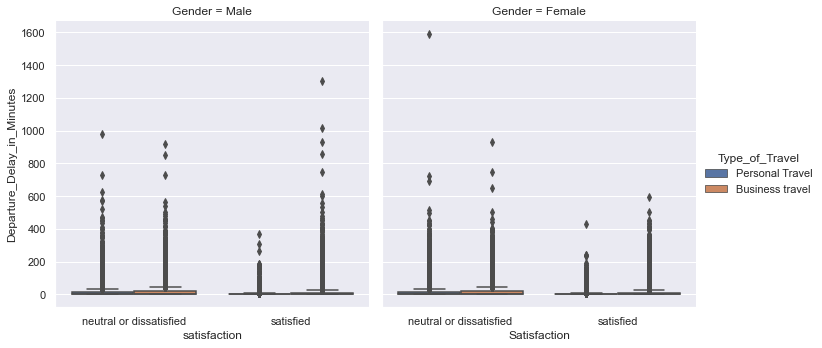

In [110]:
titlex  =  '\nDeparture_Delay_in_Minutes, Type_of_Travel Vs Satisfaction of Airline Passengers\n'
sns.catplot(data = airline_passenger_satisfaction, x = 'satisfaction', y = 'Departure_Delay_in_Minutes',\
            col = 'Gender', hue = 'Type_of_Travel', kind = 'box')
print(titlex)
plt.xlabel('Satisfaction')
plt.ylabel('Departure_Delay_in_Minutes')
plt.show()

### Inference

1) The above box plot for the prdictor variables Depature_Dealy_in_Minutes,Type_of_Travel vs the target variable satisfaction here the classifiction is soley based on the type_of_travel here the gender is differentiated as male and female

2) In the Male gender the number of neutral or dissatisfeid passengers are high in both the prsonal Travel and Bussiness Travel when compared to the satisfied passengers the Depature_Dealy_in_Minutes values for the neutral and dissatisfied lies between 0 to 200 approximately below 100 the median should be around 50 whereas in the satisfied variable there are less number of passengers who are satisfied and the Depature_Dealy_in_Minutes values for satisfied variable lies between 0 to 200 approximately and the median for personal travel is less than 50 and the median  should be around 50 for the bussiness travel. also the values are scattered and there are outliers as well

3)In the Female gender the number of neutral or dissatisfeid passengers are high in both the prsonal Travel and Bussiness Travel when compared to the satisfied passengers the Depature_Dealy_in_Minutes values for the neutral and dissatisfied lies between 0 to 200 approximately below 100 the median should be around 50 whereas in the satisfied variable there are less number of passengers who are satisfied and the Depature_Dealy_in_Minutes values for satisfied variable lies between 0 to 200 approximately and the median for personal travel is less than 50 and the median  should be around 50 for the bussiness travel. also the values are scattered and there are outliers as well

### 4.9 Satisfaction of Airline passengers Vs Arrival_Delay_in_Minutes, Type_of_Travel & Gender


Arrival_Delay_in_Minutes, Type_of_Travel Vs Satisfaction of Airline Passengers



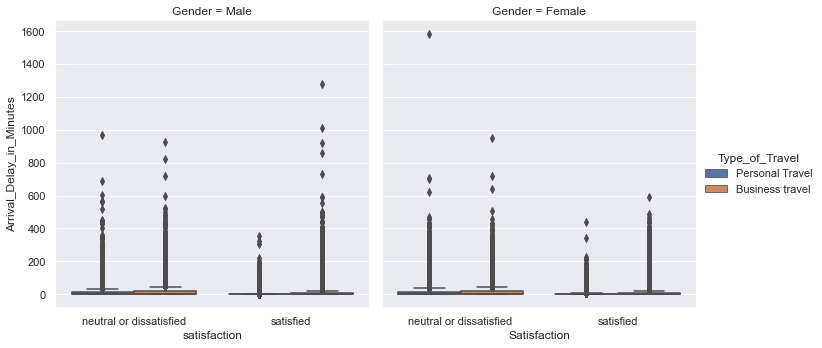

In [111]:
titlex  =  '\nArrival_Delay_in_Minutes, Type_of_Travel Vs Satisfaction of Airline Passengers\n'
sns.catplot(data = airline_passenger_satisfaction, x = 'satisfaction', y = 'Arrival_Delay_in_Minutes',\
            col = 'Gender', hue = 'Type_of_Travel', kind = 'box')
print(titlex)
plt.xlabel('Satisfaction')
plt.ylabel('Arrival_Delay_in_Minutes')
plt.show()

### Inference

1) The above box plot for the prdictor variables Arrival_Dealy_in_Minutes,Type_of_Travel vs the target variable satisfaction here the classifiction is soley based on the type_of_travel here the gender is differentiated as male and female

2) In the Male gender the number of neutral or dissatisfeid passengers are high in both the prsonal Travel and Bussiness Travel when compared to the satisfied passengers the Arrival_Dealy_in_Minutes values for the neutral and dissatisfied lies between 0 to 200 approximately below 100 the median should be around 50 whereas in the satisfied variable there are less number of passengers who are satisfied and the Arrival_Dealy_in_Minutes values for satisfied variable lies between 0 to 200 approximately and the median for personal travel is less than 50 and the median  should be around 50 for the bussiness travel. also the values are scattered and there are outliers as well

3)In the Female gender the number of neutral or dissatisfeid passengers are high in both the prsonal Travel and Bussiness Travel when compared to the satisfied passengers the Arrival_Dealy_in_Minutes values for the neutral and dissatisfied lies between 0 to 200 approximately below 100 the median should be around 50 whereas in the satisfied variable there are less number of passengers who are satisfied and the Arrival_Dealy_in_Minutes values for satisfied variable lies between 0 to 200 approximately and the median for personal travel is less than 50 and the median  should be around 50 for the bussiness travel. also the values are scattered and there are outliers as well

# 5)Base Model Building

## To print the elapsed time, first get the start time

In [112]:
import time
from datetime import timedelta

start_time = time.time()

! pip install pydotplus

! pip install pydot

In [113]:
##! conda install graphviz==0.18

In [114]:
import pandas                         as     pd
import numpy                          as     np
import seaborn                        as     sns
import matplotlib.pyplot              as     plt
import statsmodels.api                as     sm
import sys, os, six

from   sklearn                        import  metrics 
from   sklearn.metrics                import  classification_report
from   sklearn.metrics                import  confusion_matrix
from   sklearn.metrics                import  roc_curve, auc
from   sklearn.model_selection        import  train_test_split, cross_val_score
 ##!pip install pydotplus ### if not available in the Python Environment
import pydotplus

# !pip install pydot ### if not available in the Python Environment
import pydot

## ! pip install  graphviz  ### if not available in the Python Environment

import graphviz

In [115]:
from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
from   sklearn.tree             import _tree

In [116]:
def draw_cm( actual, predicted ):
    
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels = ["Yes", "No"] , yticklabels = ["Yes", "No"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()   

In [117]:
def draw_roc( actual, probs ):

    import pandas            as   pd
    import numpy             as   np
    import seaborn           as   sns
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs, pos_label = ['neutral or dissatisfied',\
    'satisfied'],     drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [118]:
def draw_decision_tree(model, X, y, flist, classlist, file_name = 'Tree'):
    
    from sklearn.tree            import export_graphviz
    from six                     import StringIO  
    from IPython.core.pylabtools import figsize
    from IPython.display         import Image
    figsize(12.5, 6)
    import pydot

    #dot_data = StringIO()  
    file_name_dot = file_name + '.dot'
    file_name_png = file_name + '.png'
    
    export_graphviz(model, out_file = file_name_dot, feature_names = flist,\
                    class_names = classlist, filled = True, rounded = True)
    (graph,) = pydot.graph_from_dot_file(file_name_dot)
    graph.write_png(file_name_png)
    return Image(file_name_png)

In [119]:
"""
   Function Name: compare_models

   Description: This **function** compares various algorithms on 
                 1) AUROC 2) Precision, 3) Recall
   
   Input: 1) splits for k fold 
          2) random seed number
          3) Training data for predictor variables
          4) Training data for target variable



   Output: Model comparison on these metrics 1) AUROC 2) Metrics - Precision, Recall
   
"""
def compare_models(n_splits, random_state, X, Y):  

    results_df   =   pd.DataFrame() ## To store the performance measures of all the six models
        
    ### To compare algorithms
    
    import  matplotlib.pyplot             as      plt
    from    sklearn.model_selection       import  StratifiedKFold
    from    sklearn.model_selection       import  cross_val_score
    from    sklearn.linear_model          import  LogisticRegression
    from    sklearn.tree                  import  DecisionTreeClassifier
    from    sklearn.naive_bayes           import  GaussianNB
    from    sklearn.ensemble              import  RandomForestClassifier
    from    sklearn.discriminant_analysis import  LinearDiscriminantAnalysis
    from    sklearn.ensemble              import  AdaBoostClassifier 
    
    ### Prepare models
    
    models  = []
    models.append(('LR', LogisticRegression(max_iter=10000))) 
    models.append(('CART', DecisionTreeClassifier()))
    models.append(('NB', GaussianNB()))
    models.append(('RF', RandomForestClassifier()))
    models.append(('ADA', AdaBoostClassifier(n_estimators = 50, learning_rate = 1))) 
    models.append(('LDA', LinearDiscriminantAnalysis()))     
    
    
    ### Evaluate model in turn
    
    scores_req   =  ['roc_auc', 'precision', 'recall']
  
    for i in range(len(scores_req)):
        names                =   []
        results              =   []
        scoring              =   scores_req[i]
        print(scoring)

        
        for name, model in models:
            model_start_time       =   time.time()
            print("\n n_splits %d random_state %d" % (n_splits, random_state))        	
            skf                    =   StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
            cv_results             =   cross_val_score(model, X, Y, cv = skf, scoring = scoring)
            results.append(cv_results)
            names.append(name)
            msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
            print(msg)
            model_elapsed_time_secs =  time.time() - start_time
            
            cv_df1                  =  pd.DataFrame({'Execution Time' : model_elapsed_time_secs, 'Model' : name,\
                                              'Scoring' : scoring, 'Measure value' : cv_results.mean()} , index = [0])
            print(cv_df1)
            results_df              =  pd.concat([results_df, cv_df1], ignore_index = True)
            
        ### Box plot algorithm comparison
        
        sub_title                   = 'Algorithm Comparison using ' + scoring
        
        fig = plt.figure()
        fig.suptitle(sub_title)
        ax  = fig.add_subplot(111)
        plt.boxplot(results)
        ax.set_xticklabels(names)
        plt.show()
    return results_df

In [120]:
def tree_to_rules(tree, feature_names, class_names):

    left = tree.tree_.children_left
    right = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth=0):

        indent = "  " * depth

        if (threshold[node] != -2):

            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")

            if left[node] != -1:

                recurse (left, right, threshold, features, left[node], depth+1)
                print(indent,"} else {")

                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)

                print(indent,"}")

        else:
            if value[node][0,0] > value[node][0,1]:
              classified = class_names[0]
            else:
              classified = class_names[1]
            print(indent,"Class = " + classified)
    recurse(left, right, threshold, features, 0)

In [121]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Age                                103904 non-null  float64
 1   Flight_Distance                    103904 non-null  float64
 2   Inflight_wifi_service              103904 non-null  int32  
 3   Departure/Arrival_time_convenient  103904 non-null  int32  
 4   Ease_of_Online_booking             103904 non-null  int32  
 5   Gate_location                      103904 non-null  int32  
 6   Food_and_drink                     103904 non-null  int32  
 7   Online_boarding                    103904 non-null  int32  
 8   Seat_comfort                       103904 non-null  int32  
 9   Inflight_entertainment             103904 non-null  int32  
 10  On-board_service                   103904 non-null  int32  
 11  Leg_room_service                   1039

In [122]:
X_df.columns

Index(['Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction', 'Gender_code', 'Customer_Type_code',
       'Type_of_Travel_code', 'Class_code'],
      dtype='object')

In [123]:
factor_var = ['Inflight_wifi_service', 'Departure/Arrival_time_convenient','Ease_of_Online_booking','Gate_location',\
              'Food_and_drink', 'Online_boarding', 'Seat_comfort','Inflight_entertainment','On-board_service',\
              'Leg_room_service','Baggage_handling', 'Checkin_service', 'Inflight_service','Cleanliness',\
              'satisfaction', 'Gender_code', 'Customer_Type_code', 'Type_of_Travel_code', 'Class_code']
###

X_df[factor_var] = X_df[factor_var].astype('category')
X_df.info()      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   Age                                103904 non-null  float64 
 1   Flight_Distance                    103904 non-null  float64 
 2   Inflight_wifi_service              103904 non-null  category
 3   Departure/Arrival_time_convenient  103904 non-null  category
 4   Ease_of_Online_booking             103904 non-null  category
 5   Gate_location                      103904 non-null  category
 6   Food_and_drink                     103904 non-null  category
 7   Online_boarding                    103904 non-null  category
 8   Seat_comfort                       103904 non-null  category
 9   Inflight_entertainment             103904 non-null  category
 10  On-board_service                   103904 non-null  category
 11  Leg_room_service          

### Prepare X representing predictor variables and y representing the response variable

In [124]:
X_df.head()

,Age,Flight_Distance,Inflight_wifi_service,Departure/Arrival_time_convenient,Ease_of_Online_booking,Gate_location,Food_and_drink,Online_boarding,Seat_comfort,Inflight_entertainment,On-board_service,Leg_room_service,Baggage_handling,Checkin_service,Inflight_service,Cleanliness,Departure_Delay_in_Minutes,Arrival_Delay_in_Minutes,satisfaction,Gender_code,Customer_Type_code,Type_of_Travel_code,Class_code
0,0.235637,0.528433,3,4,3,1,5,3,5,5,4,3,4,4,5,5,0.441873,0.444073,neutral or dissatisfied,1,0,1,2
1,0.496295,0.395800,3,2,3,3,1,3,1,1,1,5,3,1,4,1,0.094007,0.318594,neutral or dissatisfied,1,1,0,0
2,0.512187,0.708300,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0.000000,0.074062,satisfied,0,0,0,0
3,0.496295,0.568027,2,5,5,5,2,2,2,2,2,5,3,1,4,2,0.337011,0.363415,neutral or dissatisfied,0,0,0,0
4,0.862221,0.377339,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0.000000,0.074062,satisfied,1,0,0,0


In [125]:
data = X_df
data['satisfaction'].replace('neutral or dissatisfied',1, inplace = True)
data['satisfaction'].replace('satisfied',0, inplace = True)
n        =    data.shape[0]  # Get the count of records
print("Dataset has %d rows and %d columns" % (data.shape[0], data.shape[1]))

Dataset has 103904 rows and 23 columns


In [126]:
X_df['satisfaction'].value_counts()

1    58879
0    45025
Name: satisfaction, dtype: int64

In [127]:
y             =    data['satisfaction']
X             =    data.drop(['satisfaction'], axis = 1)      

### Do a spot check of models performance

roc_auc

 n_splits 10 random_state 12345
LR: 0.927697 (0.002912)
   Execution Time Model  Scoring  Measure value
0       10.926538    LR  roc_auc       0.927697

 n_splits 10 random_state 12345
CART: 0.945806 (0.001658)
   Execution Time Model  Scoring  Measure value
0       15.364737  CART  roc_auc       0.945806

 n_splits 10 random_state 12345
NB: 0.927362 (0.003224)
   Execution Time Model  Scoring  Measure value
0       16.070946    NB  roc_auc       0.927362

 n_splits 10 random_state 12345
RF: 0.993934 (0.000604)
   Execution Time Model  Scoring  Measure value
0       94.338581    RF  roc_auc       0.993934

 n_splits 10 random_state 12345
ADA: 0.977870 (0.000989)
   Execution Time Model  Scoring  Measure value
0      125.211720   ADA  roc_auc       0.977870

 n_splits 10 random_state 12345
LDA: 0.925725 (0.002909)
   Execution Time Model  Scoring  Measure value
0      127.995718   LDA  roc_auc       0.925725


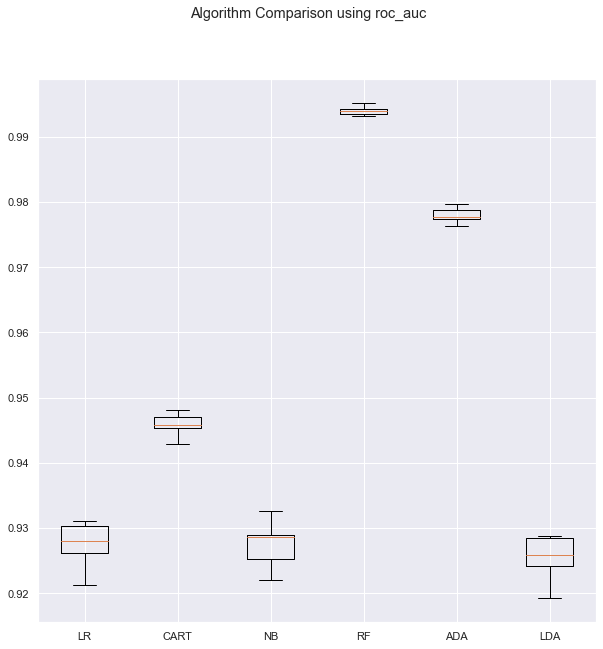

precision

 n_splits 10 random_state 12345
LR: 0.878444 (0.003676)
   Execution Time Model    Scoring  Measure value
0      137.831718    LR  precision       0.878444

 n_splits 10 random_state 12345
CART: 0.954553 (0.002227)
   Execution Time Model    Scoring  Measure value
0      142.430718  CART  precision       0.954553

 n_splits 10 random_state 12345
NB: 0.869500 (0.003862)
   Execution Time Model    Scoring  Measure value
0      143.125718    NB  precision       0.869500

 n_splits 10 random_state 12345
RF: 0.956242 (0.002091)
   Execution Time Model    Scoring  Measure value
0      218.930152    RF  precision       0.956242

 n_splits 10 random_state 12345
ADA: 0.930775 (0.003215)
   Execution Time Model    Scoring  Measure value
0      249.179613   ADA  precision       0.930775

 n_splits 10 random_state 12345
LDA: 0.876828 (0.003709)
   Execution Time Model    Scoring  Measure value
0      251.850610   LDA  precision       0.876828


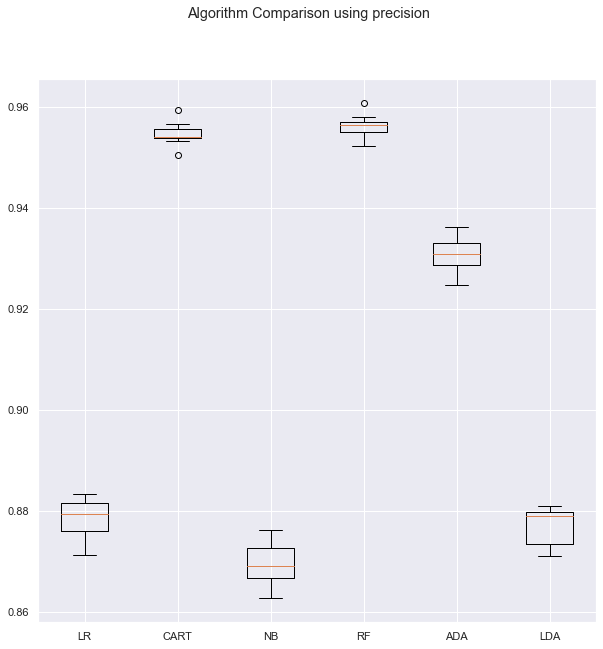

recall

 n_splits 10 random_state 12345
LR: 0.905790 (0.004620)
   Execution Time Model Scoring  Measure value
0      261.593610    LR  recall       0.905790

 n_splits 10 random_state 12345
CART: 0.951324 (0.003174)
   Execution Time Model Scoring  Measure value
0      266.092612  CART  recall       0.951324

 n_splits 10 random_state 12345
NB: 0.905094 (0.004592)
   Execution Time Model Scoring  Measure value
0      266.760609    NB  recall       0.905094

 n_splits 10 random_state 12345
RF: 0.979042 (0.001444)
   Execution Time Model Scoring  Measure value
0      344.306283    RF  recall       0.979042

 n_splits 10 random_state 12345
ADA: 0.941490 (0.003321)
   Execution Time Model Scoring  Measure value
0      377.688413   ADA  recall       0.941490

 n_splits 10 random_state 12345
LDA: 0.901782 (0.004185)
   Execution Time Model Scoring  Measure value
0      381.008285   LDA  recall       0.901782


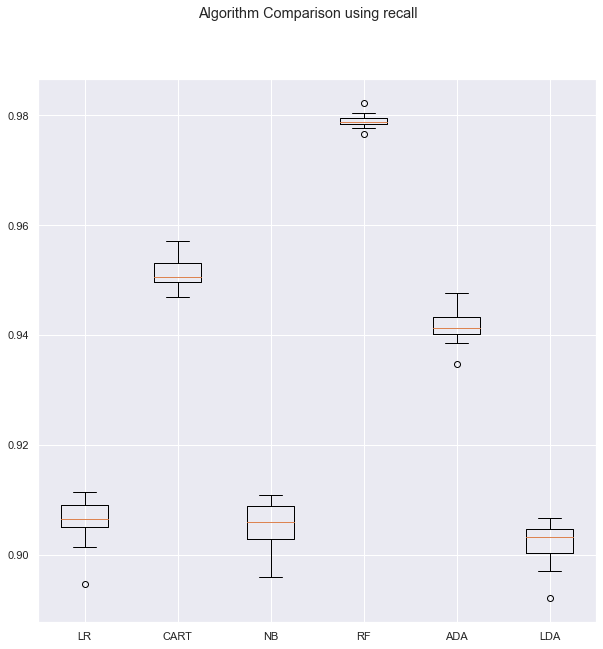

In [128]:
random_state = 12345; n_splits = 10
res_df = compare_models(n_splits, random_state, X, y)

In [129]:
print(res_df)

    Execution Time Model    Scoring  Measure value
0        10.926538    LR    roc_auc       0.927697
1        15.364737  CART    roc_auc       0.945806
2        16.070946    NB    roc_auc       0.927362
3        94.338581    RF    roc_auc       0.993934
4       125.211720   ADA    roc_auc       0.977870
5       127.995718   LDA    roc_auc       0.925725
6       137.831718    LR  precision       0.878444
7       142.430718  CART  precision       0.954553
8       143.125718    NB  precision       0.869500
9       218.930152    RF  precision       0.956242
10      249.179613   ADA  precision       0.930775
11      251.850610   LDA  precision       0.876828
12      261.593610    LR     recall       0.905790
13      266.092612  CART     recall       0.951324
14      266.760609    NB     recall       0.905094
15      344.306283    RF     recall       0.979042
16      377.688413   ADA     recall       0.941490
17      381.008285   LDA     recall       0.901782


In [130]:
pd.crosstab(res_df['Model'], res_df['Scoring'], values = res_df['Measure value'],\
            aggfunc='mean')

Scoring,precision,recall,roc_auc
Model,,,
ADA,0.930775,0.941490,0.977870
CART,0.954553,0.951324,0.945806
LDA,0.876828,0.901782,0.925725
LR,0.878444,0.905790,0.927697
NB,0.869500,0.905094,0.927362
RF,0.956242,0.979042,0.993934


### Observations

As we know, Recall, the ability of a classification model to identify all data points in a relevant class is very important to us.

Based on the above comparison chart, we observe that both Decision Tree (CART) and Random Forest models give better predictions and their recall score is above 95%. However, Logistic Regression model which has excellent explanatory power gives a good performance measure (0.9058). Let us check if the assumptions of Linear Regression model are satisfied before using them.

### Logistic Regression

#### Logistic Regression Assumptions

1) Binary logistic regression requires the target / dependent variable to be binary. For a binary regression, the factor level 1 of the dependent variable should represent the desired outcome (such as Success etc..). 

2) Only the meaningful variables should be included. 

3) The predictor variables should not be correlated to each other meaning the model should have little or no multicollinearity.

4) The independent variables are linearly related to the log odds. 

5) Logistic regression requires quite a large number of observations.

### Check the assumptions

1) Binary logistic regression requires the target / dependent variable to be binary.

For a binary regression, the factor level 1 of the dependent variable should represent the desired outcome. In our case it is class 1 - Dissatisfied customers

2) Only the meaningful variables should be included.
We have ensured that there are no unwanted variables selected for model building.

3) Absence of multicollinearity
Let us find the correlation among numerical variables. We removed the variable, Arrival_Delay_in_Minutes which was highly correlated with Departure_Delay_in_Minutes

<AxesSubplot:>

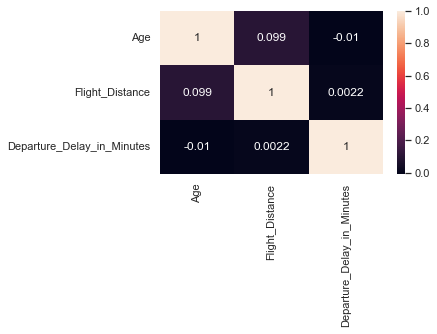

In [131]:
corr_data = pd.DataFrame(airline_passenger_satisfaction, columns= ['Age', 'Flight_Distance','Departure_Delay_in_Minutes'])
corr =corr_data.corr()
plt.figure(figsize = (5,3))
sns.heatmap(corr, annot= True)

### Observations

From the above correlation matrix, we observe that the maximum correlation coefficient is 0.099. We can see that there is a fairly weak correlation (0.099) between Age and Flight Distance. This is a absence of multicollinearity.


### 4) The independent variables are linearly related to the log odds

We need to check the assumption of Independent variables are linearly related to the log odds.

One way to checking this is to plot the Independent variables in question and look for an S-shaped curve.

In [132]:
df2 = data

In [133]:
num_variables =  ['Age', 'Flight_Distance','Departure_Delay_in_Minutes']
target        =  'satisfaction'

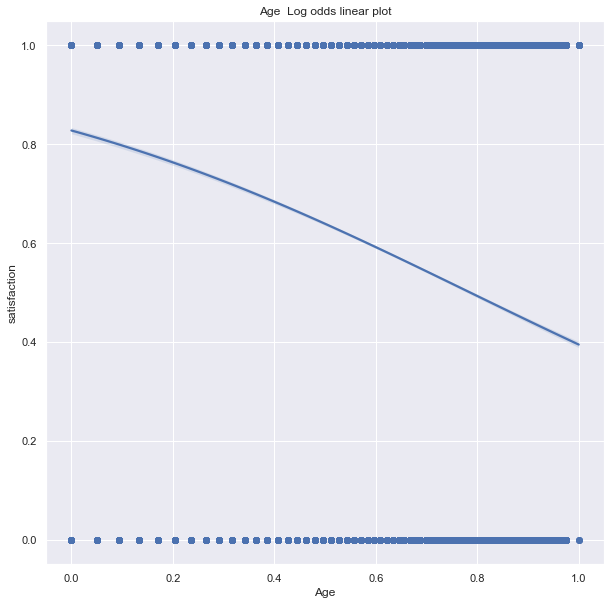

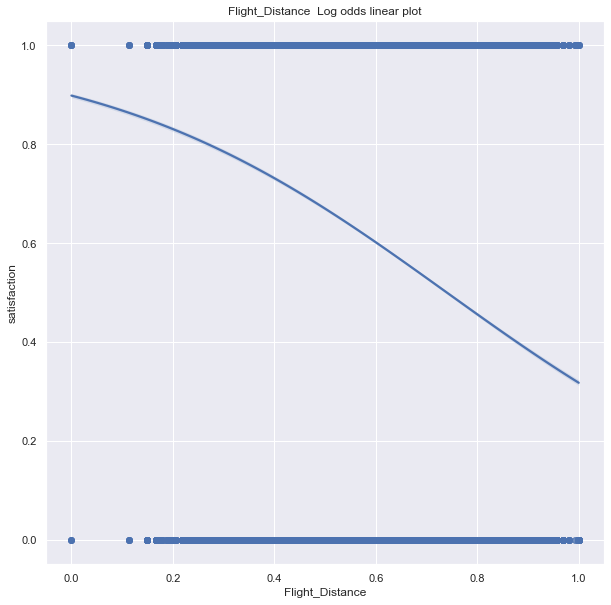

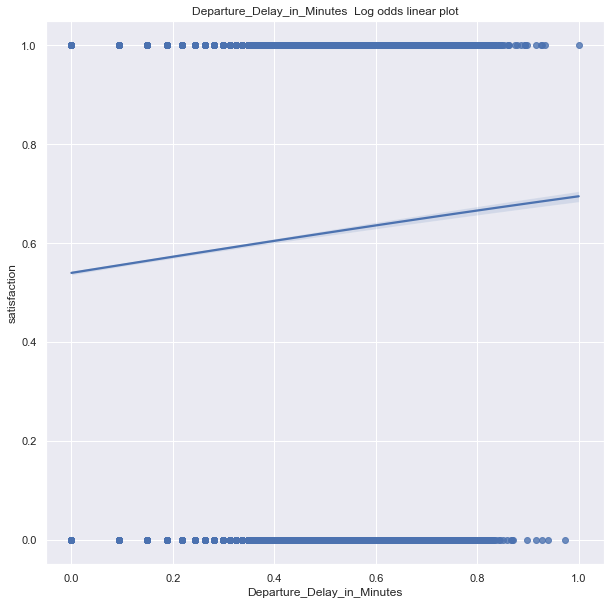

In [134]:
for i in range(len(num_variables)):
    title = num_variables[i] + '  Log odds linear plot'
    xvar  = num_variables[i]
    check_linearity(xvar,    df2, title, target)

### 5) Logistic regression requires quite a large number of observations.
A general rule of thumb is that at least 10 per variable.

We have 103904 rows and 23 columns; so we have approximately 4518 observations per variable.

**So all the assumptions are satisfied.**

In [135]:
X.columns      

Index(['Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'Gender_code', 'Customer_Type_code', 'Type_of_Travel_code',
       'Class_code'],
      dtype='object')

### Preparing the dataset for the final model

We will remove the variable,'Arrival_Delay_in_Minutes' from the list of independent variables. 

In [136]:
X = X.drop(['Arrival_Delay_in_Minutes'], axis = 1)

In [137]:
X.shape

(103904, 21)

### 5.1) Let us use Logistic Regression model as our Base model

In [138]:
seed      = 1
test_size = 0.30
### Split data into training and test datasets in the ration 70: 30
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed, stratify = y) 

### Logistic Regression Model

In [139]:
logit = sm.Logit( y_train, sm.add_constant( X_train ) )
lg    = logit.fit()

Optimization terminated successfully.
         Current function value: 0.335494
         Iterations 7


### Report Psuedo R-square, model coefficients and p-value

In [140]:
print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:           satisfaction   No. Observations:                72732
Model:                          Logit   Df Residuals:                    72710
Method:                           MLE   Df Model:                           21
Date:                Wed, 21 Sep 2022   Pseudo R-squ.:                  0.5097
Time:                        16:51:16   Log-Likelihood:                -24401.
converged:                       True   LL-Null:                       -49765.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const                                 5.7254      0.105     54.604      0.000       5.520       5.931
Age                                   0.5280      0.069      7

### Observation

We observe that the McFadden R square (Pseudo R square) is 50.97 % and the model fitness is good. This McFadden approach is one minus the ratio of two log likelihoods. The numerator is the log likelihood of the logit model selected and the denominator is the log likelihood if the model just had an intercept.

A goodness of fit using McFadden‟s pseudo r square (ρ^2) is used for fitting the overall model. McFadden suggested ρ^2 values of between 0.2 and 0.4 should be taken to represent a very good fit of the model (Louviere et al.,2000). http://www.lifesciencesite.com/lsj/life1002/286_B01288life1002_2028_2036.pdf

### List the significant variables at 5% level of significance

In [141]:
significant_vars = get_significant_vars( lg, sig_level = 0.05 )
print(significant_vars)

['const', 'Age', 'Inflight_wifi_service', 'Departure/Arrival_time_convenient', 'Ease_of_Online_booking', 'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', 'On-board_service', 'Leg_room_service', 'Baggage_handling', 'Checkin_service', 'Inflight_service', 'Cleanliness', 'Departure_Delay_in_Minutes', 'Customer_Type_code', 'Type_of_Travel_code', 'Class_code']


### Observation

The following variables are significant at 5 % level of significance:

| SlNo | Significant variable | Description |
| ---- | -------------- | ---------------- |
| 1 | Age | The actual age of the passengers |
| 2 | Inflight_wifi_service |Satisfaction level of the inflight wifi service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| 3 | Departure/Arrival_time_convenient  | Satisfaction level of Departure/Arrival time convenient (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| 4 | Ease_of_Online_booking | Satisfaction level of online booking (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied)|
| 5 | Food_and_drink | Satisfaction level of Food and drink service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| 6 | Online_boarding | Satisfaction level of online boarding (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied)|
| 7 | Seat_comfort | Satisfaction level of Seat comfort (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 8 | Inflight_entertainment | Satisfaction level of inflight entertainment (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 9 | On-board_service | Satisfaction level of On-board service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 10 | Leg_room_service | Satisfaction level of Leg room service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 11 | Baggage_handling | Satisfaction level of baggage handling (1,2,3,4,5/ 1=Least Satisfied to 5=Most Satisfied) |
| 12 | Checkin_service | Satisfaction level of Check-in service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 13 | Inflight_service | Satisfaction level of inflight service (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) | 
| 14 | Cleanliness | Satisfaction level of Cleanliness (0,1,2,3,4,5/ 0=Not Applicable; 1=Least Satisfied to 5=Most Satisfied) |
| 15 | Departure_Delay_in_Minutes | Minutes delayed when departure | 
| 16 | Customer_Type_code | The customer type (Loyal customer, disloyal customer)| 
| 17 | Type_of_Travel_code | Purpose of the flight of the passengers (Personal Travel, Business Travel) |
| 18 | Class_code | Travel class in the plane of the passengers (Business, Eco, Eco Plus)|

### Get Odds ratio

In [142]:
significant_vars_L = ['Age', 'Inflight_wifi_service',  'Departure/Arrival_time_convenient',  'Ease_of_Online_booking',\
                       'Food_and_drink', 'Online_boarding', 'Seat_comfort', 'Inflight_entertainment', 'On-board_service',\
                       'Leg_room_service', 'Baggage_handling',  'Checkin_service',  'Inflight_service',  'Cleanliness',\
                       'Departure_Delay_in_Minutes',  'Customer_Type_code',  'Type_of_Travel_code',  'Class_code']

In [143]:
print(np.exp(lg.params))

const                               306.545384
Age                                   1.695523
Flight_Distance                       1.113027
Inflight_wifi_service                 0.678883
Departure/Arrival_time_convenient     1.133409
Ease_of_Online_booking                1.141479
Gate_location                         0.979129
Food_and_drink                        1.025448
Online_boarding                       0.538422
Seat_comfort                          0.931141
Inflight_entertainment                0.948822
On-board_service                      0.736313
Leg_room_service                      0.776937
Baggage_handling                      0.879402
Checkin_service                       0.721631
Inflight_service                      0.877857
Cleanliness                           0.801300
Departure_Delay_in_Minutes            2.792617
Gender_code                           0.968604
Customer_Type_code                    7.956494
Type_of_Travel_code                  16.856591
Class_code   

In [144]:
imp_var = np.exp(lg.params).reindex(significant_vars_L).sort_values(ascending = False)

In [145]:
imp_var_df  =  pd.DataFrame({'Variable' :  imp_var.index, 'Value' : imp_var.values})

### Odds ratio 
Odds Ratio represents the odds that an outcome will occur given a particular exposure, compared to the odds of the outcome occuring in the absence of that exposure. 
Hence, we are interested in cases where the odds ratio > 1.

In [146]:
imp_var_df  =  imp_var_df.loc[imp_var_df['Value'] > 1, :]

In [147]:
imp_var_df

,Variable,Value
0,Type_of_Travel_code,16.856591
1,Customer_Type_code,7.956494
2,Departure_Delay_in_Minutes,2.792617
3,Class_code,1.704918
4,Age,1.695523
5,Ease_of_Online_booking,1.141479
6,Departure/Arrival_time_convenient,1.133409
7,Food_and_drink,1.025448


In [148]:
n             =   8
prob_List     =   [ ]
for i in range(n):
    oddsval   =  imp_var_df.loc[i, 'Value']
    print(oddsval)
    prob      =  logit_to_probability(oddsval)
    print(prob)
    prob_List.insert(i, prob)
print(prob_List)


16.856591149676238
0.944
7.956494125037524
0.8883
2.792616602979392
0.7363
1.7049175082752128
0.6303
1.6955234363586364
0.629
1.1414790215115203
0.533
1.1334085033722523
0.5313
1.0254476613590808
0.5063
[0.944, 0.8883, 0.7363, 0.6303, 0.629, 0.533, 0.5313, 0.5063]


In [149]:
imp_var_df['Probability']   =  prob_List
imp_var_df

,Variable,Value,Probability
0,Type_of_Travel_code,16.856591,0.944000
1,Customer_Type_code,7.956494,0.888300
2,Departure_Delay_in_Minutes,2.792617,0.736300
3,Class_code,1.704918,0.630300
4,Age,1.695523,0.629000
5,Ease_of_Online_booking,1.141479,0.533000
6,Departure/Arrival_time_convenient,1.133409,0.531300
7,Food_and_drink,1.025448,0.506300


### Odds ratio interpretation for top 5 important factors

Holding other things constant:

| Slno	 | Variable  | Inference |
| ---- |   ------ | ------------------------- |
| 1 | Type_of_Travel_code  | The customer who travels for personal reasons, experiences a increase of 17% in the odds of getting dissatisfied compared to a customer who travels for business reasons. |
| 2 | Customer_Type_code  | The Loyal customer experiences a increase of 8% in the odds of getting dissatisfied compared to a disloyal customer. |
| 3 | Departure_Delay_in_Minutes | One minute increase in that variable, Departure_Delay_in_Minutes is associated with 2.79% increase in the odds of the response variable, dissatisfaction occurring. |
| 4 | Class_code  | The customer who travels by Business  class experiences a increase of 1.7% in the odds of getting dissatisfied compared to customer travelling by Economy class. |
| 5 | Age  | One year increase in that variable, Age is associated with 7% increase in the odds of the response variable, dissatisfaction occurring. |



From the above, we can infer that The following five predictor variables (top 5) influence the target variabl more then the rest of the predictor variables:

1) Type_of_Travel_code 2) Customer_Type_Code 3) Departure_Delay_in_Minutes 4) Class_Code and 5) Age

## Now we try to improve our modelling score by trying out Decision Tree and its variants.

#### Decision Tree

In [150]:
import time
from datetime import timedelta

start_time = time.time()

In [151]:
! pip install pydotplus

In [152]:
! pip install pydot

In [153]:
! conda install graphviz==0.18

Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.



PackagesNotFoundError: The following packages are not available from current channels:

  - graphviz==0.18

Current channels:

  - https://repo.anaconda.com/pkgs/main/win-64
  - https://repo.anaconda.com/pkgs/main/noarch
  - https://repo.anaconda.com/pkgs/r/win-64
  - https://repo.anaconda.com/pkgs/r/noarch
  - https://repo.anaconda.com/pkgs/msys2/win-64
  - https://repo.anaconda.com/pkgs/msys2/noarch

To search for alternate channels that may provide the conda package you're
looking for, navigate to

    https://anaconda.org

and use the search bar at the top of the page.




In [154]:
import pandas                         as     pd
import numpy                          as     np
import seaborn                        as     sns
import matplotlib.pyplot              as     plt
import statsmodels.api                as     sm
import sys, os, six

from   sklearn                        import  metrics 
from   sklearn.metrics                import  classification_report
from   sklearn.metrics                import  confusion_matrix
from   sklearn.metrics                import  roc_curve, auc
from   sklearn.model_selection        import  train_test_split, cross_val_score
 ##!pip install pydotplus ### if not available in the Python Environment
import pydotplus

# !pip install pydot ### if not available in the Python Environment
import pydot

## ! pip install  graphviz  ### if not available in the Python Environment

import graphviz

In [155]:
from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
from   sklearn.tree             import _tree

In [156]:
def draw_cm( actual, predicted ):
    
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels = ["Yes", "No"] , yticklabels = ["Yes", "No"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()   

In [157]:
def draw_roc( actual, probs ):

    import pandas            as   pd
    import numpy             as   np
    import seaborn           as   sns
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs, pos_label = ['neutral or dissatisfied',\
    'satisfied'],     drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [158]:
def draw_decision_tree(model, X, y, flist, classlist, file_name = 'Tree'):
    
    from sklearn.tree            import export_graphviz
    from six                     import StringIO  
    from IPython.core.pylabtools import figsize
    from IPython.display         import Image
    figsize(12.5, 6)
    import pydot

    #dot_data = StringIO()  
    file_name_dot = file_name + '.dot'
    file_name_png = file_name + '.png'
    
    export_graphviz(model, out_file = file_name_dot, feature_names = flist,\
                    class_names = classlist, filled = True, rounded = True)
    (graph,) = pydot.graph_from_dot_file(file_name_dot)
    graph.write_png(file_name_png)
    return Image(file_name_png)

In [159]:
def tree_to_rules(tree, feature_names, class_names):

    left = tree.tree_.children_left
    right = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth=0):

        indent = "  " * depth

        if (threshold[node] != -2):

            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")

            if left[node] != -1:

                recurse (left, right, threshold, features, left[node], depth+1)
                print(indent,"} else {")

                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)

                print(indent,"}")

        else:
            if value[node][0,0] > value[node][0,1]:
              classified = class_names[0]
            else:
              classified = class_names[1]
            print(indent,"Class = " + classified)
    recurse(left, right, threshold, features, 0)

In [160]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   Age                                103904 non-null  float64 
 1   Flight_Distance                    103904 non-null  float64 
 2   Inflight_wifi_service              103904 non-null  category
 3   Departure/Arrival_time_convenient  103904 non-null  category
 4   Ease_of_Online_booking             103904 non-null  category
 5   Gate_location                      103904 non-null  category
 6   Food_and_drink                     103904 non-null  category
 7   Online_boarding                    103904 non-null  category
 8   Seat_comfort                       103904 non-null  category
 9   Inflight_entertainment             103904 non-null  category
 10  On-board_service                   103904 non-null  category
 11  Leg_room_service          

In [161]:
X_df.columns

Index(['Age', 'Flight_Distance', 'Inflight_wifi_service',
       'Departure/Arrival_time_convenient', 'Ease_of_Online_booking',
       'Gate_location', 'Food_and_drink', 'Online_boarding', 'Seat_comfort',
       'Inflight_entertainment', 'On-board_service', 'Leg_room_service',
       'Baggage_handling', 'Checkin_service', 'Inflight_service',
       'Cleanliness', 'Departure_Delay_in_Minutes', 'Arrival_Delay_in_Minutes',
       'satisfaction', 'Gender_code', 'Customer_Type_code',
       'Type_of_Travel_code', 'Class_code'],
      dtype='object')

In [162]:
factor_var = ['Inflight_wifi_service', 'Departure/Arrival_time_convenient','Ease_of_Online_booking','Gate_location',\
              'Food_and_drink', 'Online_boarding', 'Seat_comfort','Inflight_entertainment','On-board_service',\
              'Leg_room_service','Baggage_handling', 'Checkin_service', 'Inflight_service','Cleanliness',\
              'satisfaction', 'Gender_code', 'Customer_Type_code', 'Type_of_Travel_code', 'Class_code']
###

X_df[factor_var] = X_df[factor_var].astype('category')
X_df.info()      

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype   
---  ------                             --------------   -----   
 0   Age                                103904 non-null  float64 
 1   Flight_Distance                    103904 non-null  float64 
 2   Inflight_wifi_service              103904 non-null  category
 3   Departure/Arrival_time_convenient  103904 non-null  category
 4   Ease_of_Online_booking             103904 non-null  category
 5   Gate_location                      103904 non-null  category
 6   Food_and_drink                     103904 non-null  category
 7   Online_boarding                    103904 non-null  category
 8   Seat_comfort                       103904 non-null  category
 9   Inflight_entertainment             103904 non-null  category
 10  On-board_service                   103904 non-null  category
 11  Leg_room_service          

In [163]:
seed      = 1
test_size = 0.30
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed, stratify = y) 

In [164]:
clf    = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf    = clf.fit(X_train,y_train)

In [165]:
predicted_train = clf.predict(X_train)


Training Data
[[31517     0]
 [    0 41215]]


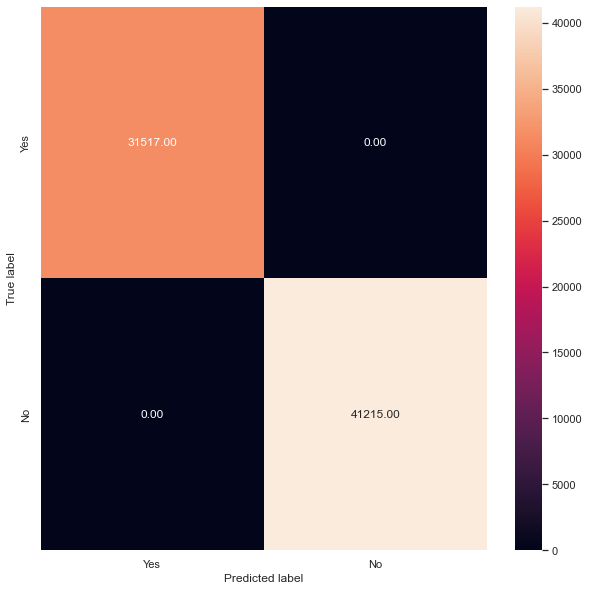

Training Accuracy: 100.000%


In [166]:
matrix             = confusion_matrix(y_train, predicted_train)
print("\nTraining Data")
print(matrix)
draw_cm(y_train, predicted_train)
###     
accuracy_train = clf.score(X_train, y_train) 
print("Training Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [167]:
measures_train     = classification_report(y_train, predicted_train) 
print("\nTraining data")
print(measures_train) 


Training data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31517
           1       1.00      1.00      1.00     41215

    accuracy                           1.00     72732
   macro avg       1.00      1.00      1.00     72732
weighted avg       1.00      1.00      1.00     72732



In [168]:
from   sklearn.metrics                import  roc_curve, auc,roc_auc_score

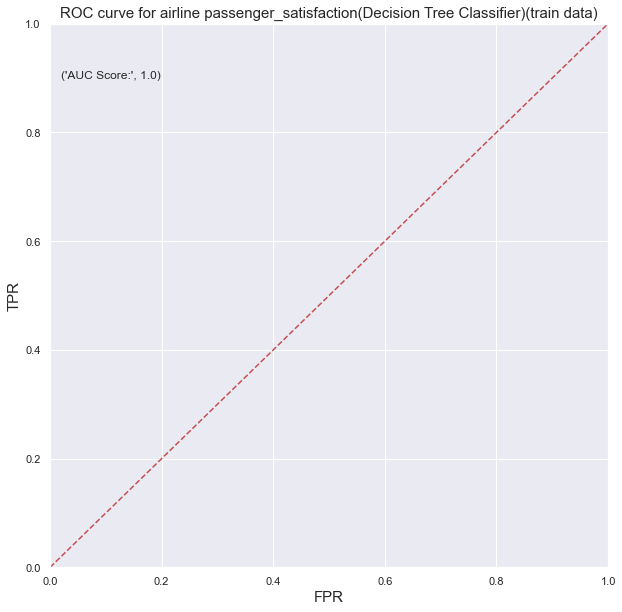

In [169]:
fpr,tpr,thresholds = roc_curve(y_train,predicted_train)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(Decision Tree Classifier)(train data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_train,predicted_train),4)))
plt.grid(True)

In [170]:
predicted_testing = clf.predict(X_test)


Testing Data
[[12736   772]
 [  899 16765]]


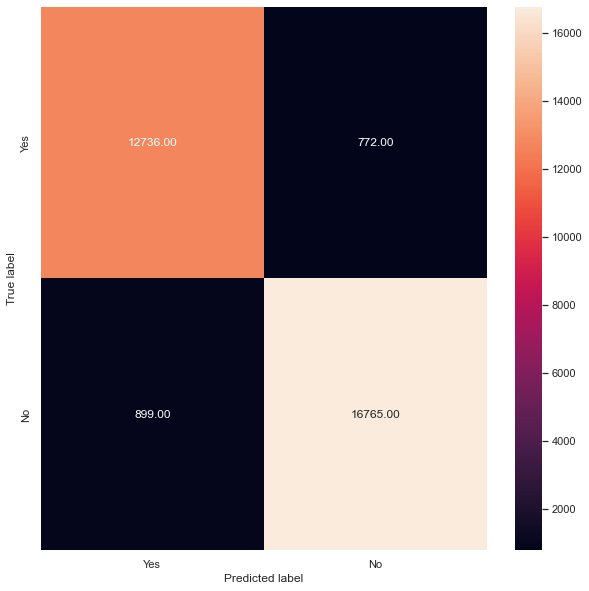

Testing Accuracy: 94.639%


In [171]:
matrix             = confusion_matrix(y_test, predicted_testing)
print("\nTesting Data")
print(matrix)
draw_cm(y_test, predicted_testing )
    
accuracy_train = clf.score(X_test, y_test) 
print("Testing Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [172]:
measures_test     = classification_report(y_test, predicted_testing) 
print("\nTraining data")
print(measures_test) 


Training data
              precision    recall  f1-score   support

           0       0.93      0.94      0.94     13508
           1       0.96      0.95      0.95     17664

    accuracy                           0.95     31172
   macro avg       0.95      0.95      0.95     31172
weighted avg       0.95      0.95      0.95     31172



In [173]:
predicted_testing = clf.predict(X_test)

In [174]:
from   sklearn.metrics                import  roc_curve, auc

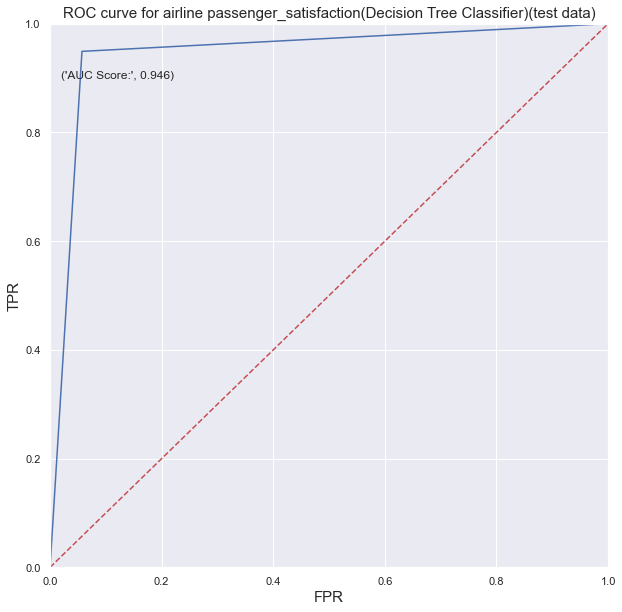

In [175]:
fpr,tpr,thresholds = roc_curve(y_test,predicted_testing)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(Decision Tree Classifier)(test data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_test,predicted_testing),4)))
plt.grid(True)

#### Observations

Area under Roc curve signifies how well model is able to discriminate between the two classes As our score is above 0.90 it can be considered to be very good i.e the model is able to predict the correct class very well. We can also see that training roc auc score and testing roc auc score are not that similar hence their is chance of overfitting.
We know that DT are highly prone to overfitting unless they are pruned hence we consider pruning the model.

#### Get insights from the model

Feature importance scores can provide insight into the model. Most importance scores are calculated by a predictive model that has been fit on the dataset. Inspecting the importance score provides insight into that specific model and which features are the most important and least important to the model when making a prediction. This is a type of model interpretation that can be performed for those models that support it.

Decision tree algorithms like classification and regression trees (CART) offer importance scores based on the reduction in the criterion used to select split points, like Gini or entropy.

#### Get insights from the model

In [176]:
flist     = X.columns
classlist = ['Satisfied', 'Not Satisfied']

####  plot a tree

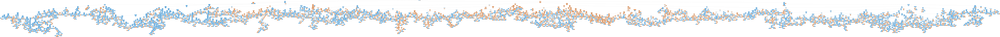

In [177]:
draw_decision_tree(clf, X_train, y_train, flist, classlist, file_name = 'Tree')

##### Pruning the tree

In [178]:
clf1    = DecisionTreeClassifier(max_depth = 4, random_state = 12345).fit(X_train,y_train)

"""

DecisionTreeClassifier(
    *,
    criterion='gini',
    splitter='best',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    class_weight=None,
    ccp_alpha=0.0,
)

"""

"\n\nDecisionTreeClassifier(\n    *,\n    criterion='gini',\n    splitter='best',\n    max_depth=None,\n    min_samples_split=2,\n    min_samples_leaf=1,\n    min_weight_fraction_leaf=0.0,\n    max_features=None,\n    random_state=None,\n    max_leaf_nodes=None,\n    min_impurity_decrease=0.0,\n    class_weight=None,\n    ccp_alpha=0.0,\n)\n\n"

#### Plot a Pruned tree

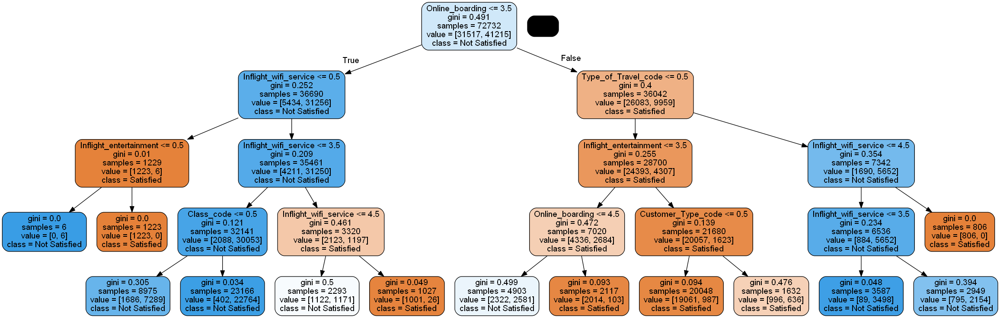

In [179]:
draw_decision_tree(clf1, X_train, y_train, flist, classlist, file_name = 'Tree')

1)A decision tree is built from top to bottom. That is we begin with the root node.While constructing a decision tree we try to achieve pure nodes.A node is considered to be pure when all the data points belong to the same class.This purity of nodes is determined using the entropy value

2)Here we consider Online_boarding as our root node because it has the most number of information where 72732 samples are considered

3) After root node the nodes are further pruned into inflight_wifi_services and type_of_travel_code as our branch nodes which has most number of samples after Online_boarding

4) The leaf nodes are further splitted based on these two values

5) For inflight_wifi_services the leaf nodes are cleanliness and infi_wifi_services and the leafs are further splitted based on satisfied and not satisfied and the purity of the node is measured with the help of gini index

6) for cleanliness we can find that out of 1229 samples only 6 passengers feels disstaisfied and 1223 passengers feel satisfied with the cleanliness and the gini index score for cleanliness is 0 whch concludes no information gain

7) whereas for the inflight_wifi_services out of 354161 samples 32141 samples feels dissatisfied and 3320 passengers feel satisfied on comparing the gini index we can find out that most of the passengers were dissatisfied as the gini index 0.305 which is high amoung the four values

8) for type_of_travel_code the leaf nodes are inflight_entertainment and inflight_wifi_services out of 36042 samples 28700 are in inflight_entertainement and 7342 samples are for inflight_wifi_services

9) for inflight_entertainemnt the leaves are further split into online_boarding and customer_type where 7020 samples are for online and boarding and customer_type_code has 21680 samples and the leaves are further split based on the class where 4903 samples are not satisfied and 2117 samples are satisfied and comparing the gini index score 0.499 is high which has the most information gain and for customer_type_code 20048 samples and 1632 samples are for the satisfied class and on comparing the gini index scores we can find that 0.476 is high and the information gain is also high

10) for inflight_wifi_services 6536 samples are for the not satisfied class and 806 values are for satisfied class. in the not satisfied class the nodes are further split and the samples are splitted 3587 samples and 2949 samples respectively and on comparing the gini index scores we can infer that 0.394 is high and the information gain is also high

In [180]:
tree_to_rules(clf1, flist, classlist)

 if ( Online_boarding <= 3.5 ) {
   if ( Inflight_wifi_service <= 0.5 ) {
     if ( Inflight_entertainment <= 0.5 ) {
       Class = Not Satisfied
     } else {
       Class = Satisfied
     }
   } else {
     if ( Inflight_wifi_service <= 3.5 ) {
       if ( Class_code <= 0.5 ) {
         Class = Not Satisfied
       } else {
         Class = Not Satisfied
       }
     } else {
       if ( Inflight_wifi_service <= 4.5 ) {
         Class = Not Satisfied
       } else {
         Class = Satisfied
       }
     }
   }
 } else {
   if ( Type_of_Travel_code <= 0.5 ) {
     if ( Inflight_entertainment <= 3.5 ) {
       if ( Online_boarding <= 4.5 ) {
         Class = Not Satisfied
       } else {
         Class = Satisfied
       }
     } else {
       if ( Customer_Type_code <= 0.5 ) {
         Class = Satisfied
       } else {
         Class = Satisfied
       }
     }
   } else {
     if ( Inflight_wifi_service <= 4.5 ) {
       if ( Inflight_wifi_service <= 3.5 ) {
         Class = Not

In [181]:
predicted_train1 = clf1.predict(X_train)

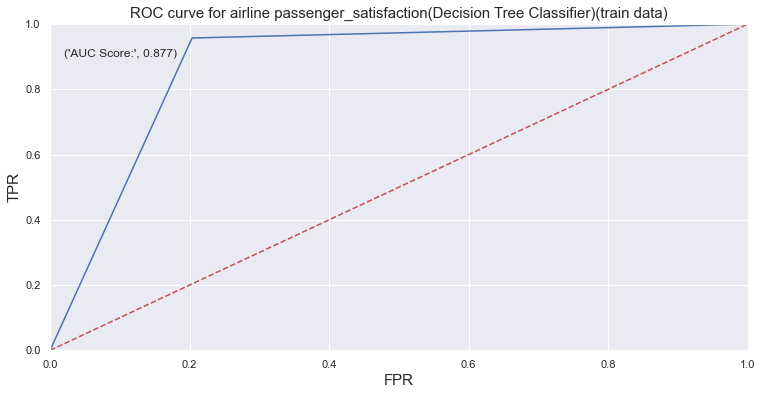

In [182]:
fpr,tpr,thresholds = roc_curve(y_train,predicted_train1)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(Decision Tree Classifier)(train data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_train,predicted_train1),4)))
plt.grid(True)

In [183]:
predicted_testing1 = clf1.predict(X_test)

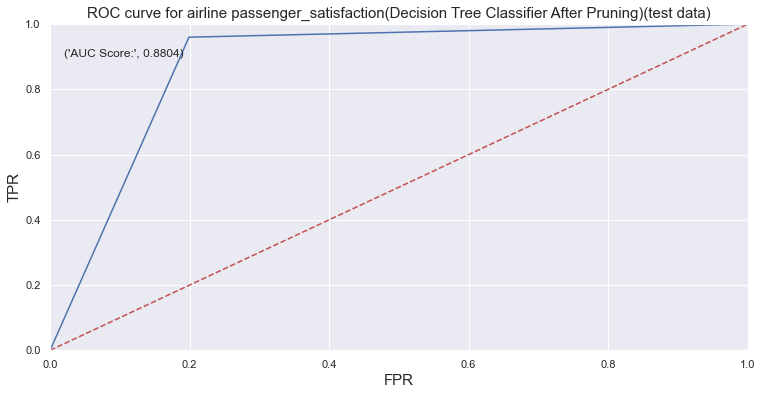

In [184]:
fpr,tpr,thresholds = roc_curve(y_test,predicted_testing1)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(Decision Tree Classifier After Pruning)(test data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_test,predicted_testing1),4)))
plt.grid(True)

Roc Auc score is reduced from perfect 1 to 0.877 after pruning tree on Train Data 
and for test Data score also from decresed 0.94 to 0.88 
But now training & testing scores are much similar hence ruling the chance of overfitting now.

#### Variable Feature Importance Graph

<function matplotlib.pyplot.show(close=None, block=None)>

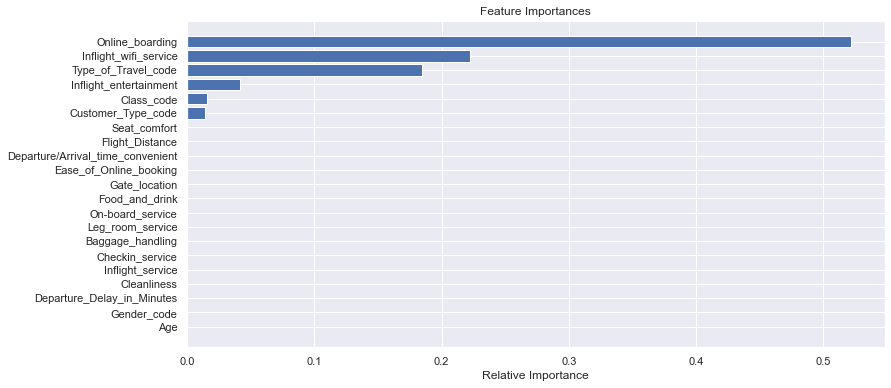

In [185]:
importances = clf1.feature_importances_
indices     = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [flist[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show

#### observation

From the Variable Feature Importance Graph we can infer that The following predictor variables influence the target variabl more then the rest of the predictor variables:

1) Online_Boarding 2) Inflight_wifi_service 3) Type_of_Travel_code 4) Inflight_entertainment 5) Customer_Type_Code

In [186]:
idf =  pd.DataFrame({'Name' : [flist[i] for i in indices], 'Value' : importances[indices] *100 })

In [187]:
idf.sort_values('Value', ascending = False, inplace = True)
idf.set_index(keys = 'Name', inplace = True)

In [188]:
idf

,Value
Name,
Online_boarding,52.212005
Inflight_wifi_service,22.212200
Type_of_Travel_code,18.431993
Inflight_entertainment,4.164180
Class_code,1.543621
Customer_Type_code,1.436001
Ease_of_Online_booking,0.000000
Seat_comfort,0.000000
Flight_Distance,0.000000


## Before trying Random Forest as it was showing maximum Recall, lets consider using ensemble method Boosting

## using Adaboost (Adaptive Boosting)

Advatanges 

--> AdaBoost is not prone to overfitting

--> improves the accuracy of weak classifiers hence making it flexible

In [189]:
from sklearn.ensemble import AdaBoostClassifier

In [190]:
clf2 =AdaBoostClassifier(n_estimators=50,learning_rate=1).fit(X_train,y_train)

In [191]:
predicted_trainAB = clf2.predict(X_train)


Training Data
[[28611  2906]
 [ 2374 38841]]


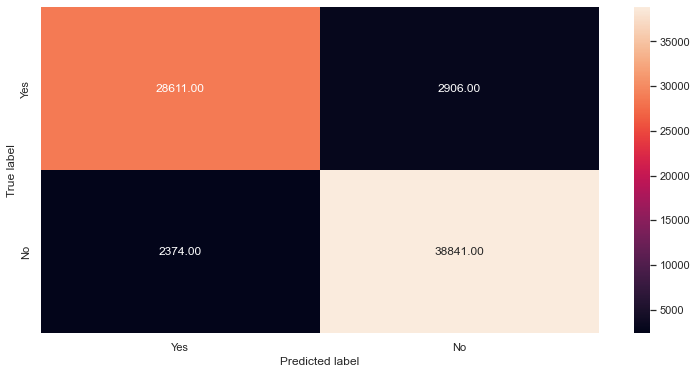

Training Accuracy: 92.740%


In [192]:
matrix             = confusion_matrix(y_train, predicted_trainAB)
print("\nTraining Data")
print(matrix)
draw_cm(y_train, predicted_trainAB)
###     
accuracy_train = clf2.score(X_train, y_train) 
print("Training Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [193]:
measures_trainAB     = classification_report(y_train, predicted_trainAB) 
print("\nTraining data")
print(measures_trainAB) 


Training data
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     31517
           1       0.93      0.94      0.94     41215

    accuracy                           0.93     72732
   macro avg       0.93      0.93      0.93     72732
weighted avg       0.93      0.93      0.93     72732



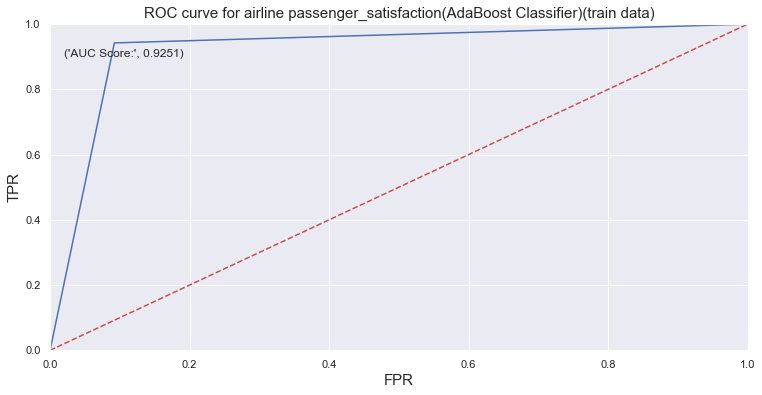

In [194]:
fpr,tpr,thresholds = roc_curve(y_train,predicted_trainAB)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(AdaBoost Classifier)(train data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_train,predicted_trainAB),4)))
plt.grid(True)

In [195]:
predicted_testingAB = clf2.predict(X_test)


Testing Data
[[12267  1241]
 [ 1061 16603]]


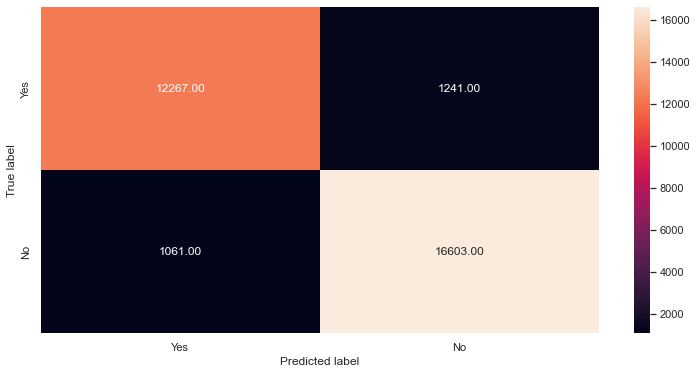

Testing Accuracy: 94.639%


In [196]:
matrix             = confusion_matrix(y_test, predicted_testingAB)
print("\nTesting Data")
print(matrix)
draw_cm(y_test, predicted_testingAB )
    
accuracy_train = clf.score(X_test, y_test) 
print("Testing Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [197]:
measures_test     = classification_report(y_test, predicted_testingAB) 
print("\nTraining data")
print(measures_test) 


Training data
              precision    recall  f1-score   support

           0       0.92      0.91      0.91     13508
           1       0.93      0.94      0.94     17664

    accuracy                           0.93     31172
   macro avg       0.93      0.92      0.92     31172
weighted avg       0.93      0.93      0.93     31172



In [198]:
predicted_testingAB = clf.predict(X_test)

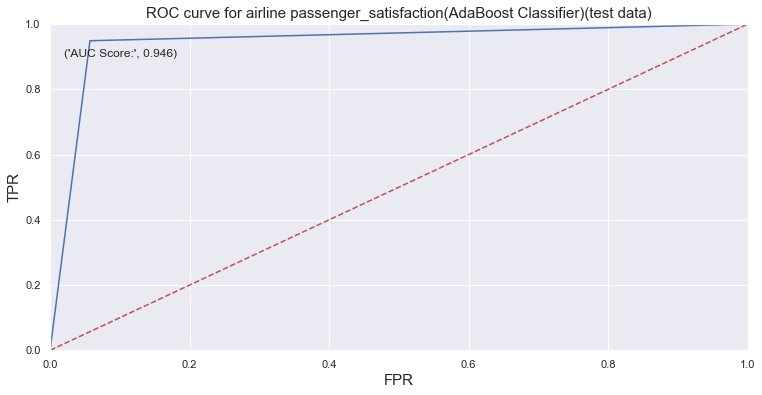

In [199]:
fpr,tpr,thresholds = roc_curve(y_test,predicted_testingAB)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(AdaBoost Classifier)(test data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_test,predicted_testingAB),4)))
plt.grid(True)

Roc Auc score has improved after implementing Boosting 
Also, now training & testing scores are very much similar hence ruling the chance of overfitting now.

#### Variable Feature Importance Graph

<function matplotlib.pyplot.show(close=None, block=None)>

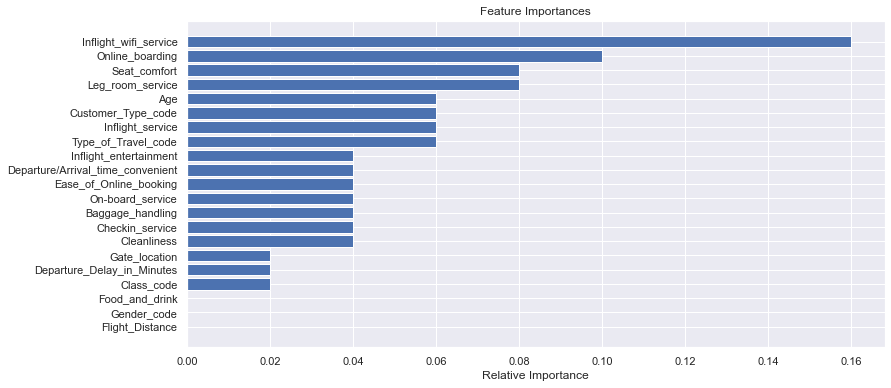

In [200]:
importances = clf2.feature_importances_
indices     = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [flist[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show

## observation
From the Variable Feature Importance Graph we can infer that The following predictor variables influence the target variabl more then the rest of the predictor variables:

1) Inflight_wifi_service 2) Online_Boarding 2) Seat_Comfort 3) Leg_Room_Service 4) Age 5) Customer_Type_Code
6) Inflight Service 7) Type of Travel Code

#### Random Forest classifier

In [201]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [202]:
rf = RandomForestClassifier(n_jobs=4,random_state=100,criterion='gini',max_depth=15,min_samples_leaf=10,n_estimators=100,verbose=False)
dt = DecisionTreeClassifier(random_state=100,criterion='gini',max_depth=15,min_samples_leaf=10)

In [203]:
rf_model= rf.fit(X_train,y_train)
ytrain_pred = rf_model.predict(X_train)
ytest_pred = rf_model.predict(X_test)


Training Data
[[29644  1873]
 [  942 40273]]


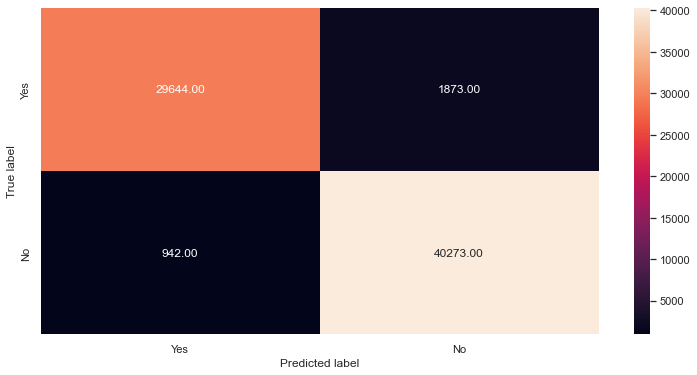

In [204]:
matrix             = confusion_matrix(y_train,ytrain_pred)
print("\nTraining Data")
print(matrix)
draw_cm(y_train,ytrain_pred )
    
##accuracy_train = clf.score(X_test, y_test) 
##print("Testing Accuracy: %.3f%%" % (accuracy_train * 100.0))

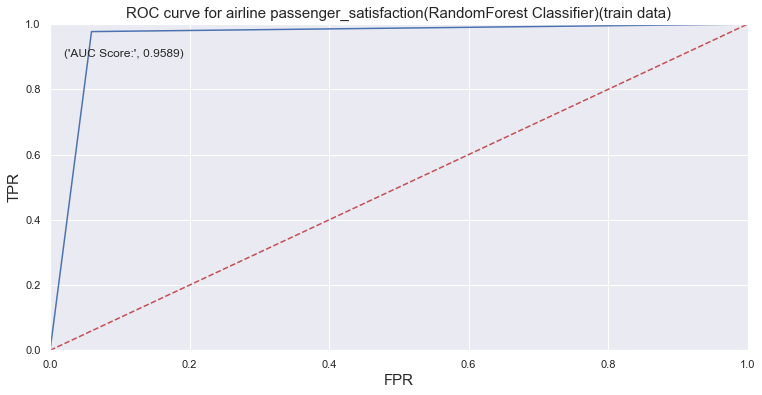

In [205]:
fpr,tpr,thresholds = roc_curve(y_train,ytrain_pred)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(RandomForest Classifier)(train data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_train,ytrain_pred),4)))
plt.grid(True)


Testing Data
[[12629   879]
 [  529 17135]]


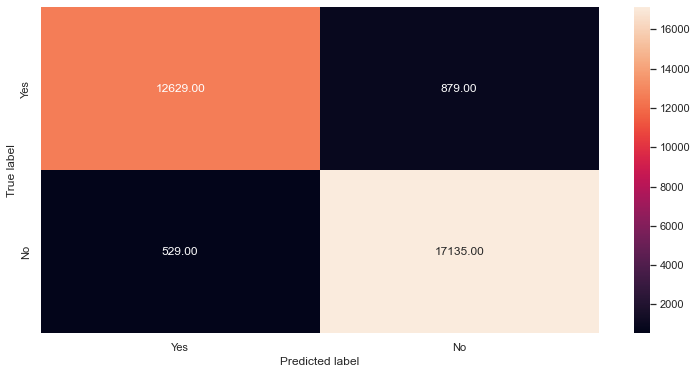

In [206]:
matrix             = confusion_matrix(y_test,ytest_pred)
print("\nTesting Data")
print(matrix)
draw_cm(y_test,ytest_pred )

In [207]:
from   sklearn.metrics                import  roc_curve, auc,roc_auc_score

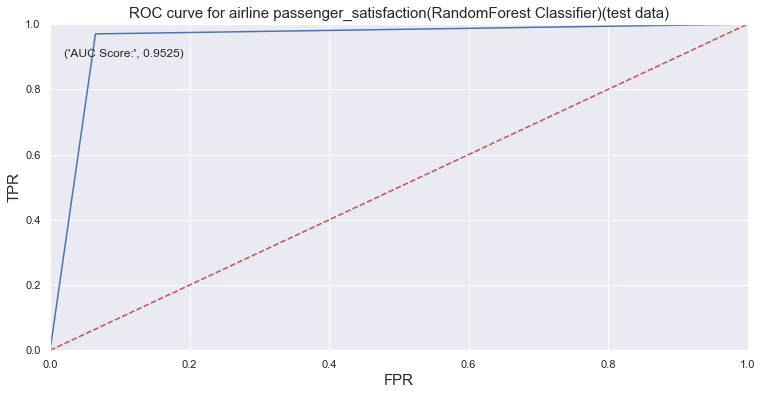

In [208]:
fpr,tpr,thresholds = roc_curve(y_test,ytest_pred)
plt.plot(fpr,tpr)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.plot([0,1],[0,1],'r--')
plt.title('ROC curve for airline passenger_satisfaction(RandomForest Classifier)(test data)',fontsize=15)
plt.xlabel('FPR',fontsize=15)
plt.ylabel('TPR',fontsize=15)
plt.text(x=0.02,y=0.9,s=('AUC Score:',round(roc_auc_score(y_test,ytest_pred),4)))
plt.grid(True)

Area under Roc curve signifies how well model is able to discriminate between the two classes
As our score is above 0.95 it can be considered to be very good i.e the model is able to predict the correct class very well.
We can also see that training roc auc score and testing roc auc score are very similar hence their is no overfitting.

In [209]:
from sklearn.metrics import classification_report

#### Train Data

In [210]:
class_report = classification_report(y_train,ytrain_pred)
print('RandomForest Classifier classification Report:')
print(class_report)

RandomForest Classifier classification Report:
              precision    recall  f1-score   support

           0       0.97      0.94      0.95     31517
           1       0.96      0.98      0.97     41215

    accuracy                           0.96     72732
   macro avg       0.96      0.96      0.96     72732
weighted avg       0.96      0.96      0.96     72732



#### Test Data

In [211]:
class_report = classification_report(y_test,ytest_pred)
print('RandomForest Classifier classification Report:')
print(class_report)

RandomForest Classifier classification Report:
              precision    recall  f1-score   support

           0       0.96      0.93      0.95     13508
           1       0.95      0.97      0.96     17664

    accuracy                           0.95     31172
   macro avg       0.96      0.95      0.95     31172
weighted avg       0.95      0.95      0.95     31172



<function matplotlib.pyplot.show(close=None, block=None)>

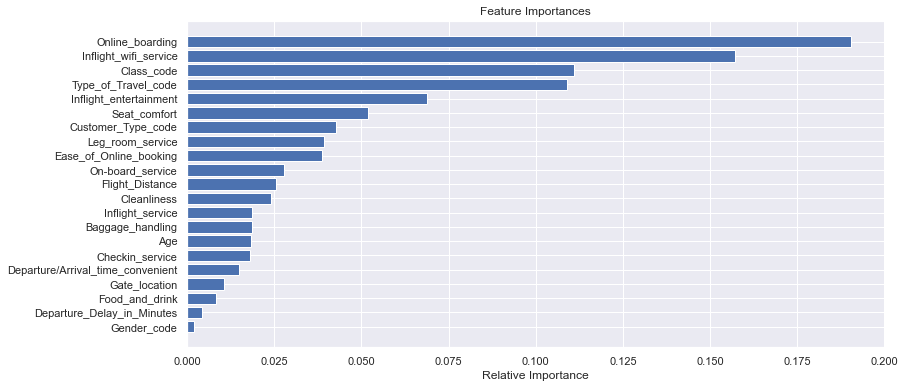

In [212]:
importances1 = rf_model.feature_importances_
indices     = np.argsort(importances1)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances1[indices], color='b', align='center')
plt.yticks(range(len(indices)), [flist[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show

observation
From the Variable Feature Importance Graph we can infer that The following predictor variables influence the target variabl more then the rest of the predictor variables:

1) Online_Boarding  
2) Inflight_wifi_service 
3)Class code 
4) Type_of_Travel_code 
5) Inflight_entertainment

## Conclusion

We can conclude that Random Forest gives us the best performance out of all the variants.
And from all the models below variables as per each model are influcing the target variable the most.
Out of all variable Type_of_Travel_code is common in all the models.

DF-Pruning:
1) Online_Boarding 2) Inflight_wifi_service 3) Type_of_Travel_code 4) Inflight_entertainment 5) Customer_Type_Code

AdaBoost:
1) Inflight_wifi_service 2) Online_Boarding 2) Seat_Comfort 3) Leg_Room_Service 4) Age 5) Customer_Type_Code
6) Inflight Service 7) Type of Travel Code

RF:
1) Online_Boarding 2) Inflight_wifi_service 3)Class code 4) Type_of_Travel_code 5) Inflight_entertainment

LR: 
1) Type_of_Travel_code 2) Customer_Type_Code 3) Departure_Delay_in_Minutes 4) Class_Code and 5) Age

we can conclude that 1) Type_of_travel_code 2) Customer_type_code 3) class_code